# Supplementary Random Forest Analysis

- Supplementary code from the main notebook, Training_RandomForest.
- Archived figures from development phase



In [1]:
# Import Packages
#Data Structure/Organization Packages
import pandas as pd
import xarray as xr
import numpy as np
import numpy.ma as ma
from datetime import datetime
import scipy
import os

# Plotting Packages
import matplotlib
import matplotlib.pyplot as plt
from cmocean import cm as cmo
import seaborn as sns
import matplotlib.patches as patch
from labellines import labelLine, labelLines
from matplotlib.ticker import FormatStrFormatter
import matplotlib.patheffects as pe

# Utility Packages
import random as rand
import os
import math
# import dataframe_image as dfi
import itertools
from scipy import interpolate
from tqdm import tqdm
from importlib import reload

# Oceanography Packages
import gsw

# Image
import imageio.v2 as iio
import matplotlib.patches as patch
import cartopy.crs as ccrs                   # import projections
import cartopy.feature as cf                 # import features
from IPython.display import Image

import cartopy.crs as ccrs                   # import projections
import cartopy.feature as cf    


In [2]:
# Modules
import mod_main as sg
import mod_L3proc as gproc     # for L3 grid processing
import mod_DFproc as dfproc    # for dataframe processing
import mod_plot as sgplot 
import mod_RFR as rfr

# Download data
# from mod_main import floatDF, shipDF # input data
from mod_main import sgfloat, dav_float # sogos float (yd<205)
from mod_main import dav_6030 # long mld series for 5906030

from mod_main import sg659, sg660 
from mod_main import dav_659, dav_660
from mod_main import df_659, df_660 # output of this notebook

from mod_RFR import var_list, model_list
from mod_RFR import mltraining, mlvalidation, mltest
from mod_RFR import RF_test, RF_validation

from mod_RFR import RF_pred_6030, ESPER_pred, CANYON_pred

In [3]:
plt.rcParams.update(sgplot.my_params(14))

In [4]:
from mod_plot import * # for unit labels

In [5]:
print('RFR Validation Errors') 
rfr.print_errors(RF_validation['Model_G'], var='val_error', pres_lim = [0,1000])

# print('RFR Test Errors') 
# crf.print_errors(RF_test['Model_G'], var='test_error', pres_lim = [0,1000])

RFR Validation Errors
Error metric: val_error
Restricted to depths 0 to 1000:
median abs error: 	0.1422642096766182
mean abs error 		0.20584452441725407

95% of errors fall between:
-0.58111 to 0.59002

During SOGOS between depths 0 to 1000:
95% of errors fall between:
-0.65372 to 0.63259


# Study Region maps

Text(0, 0.5, '')

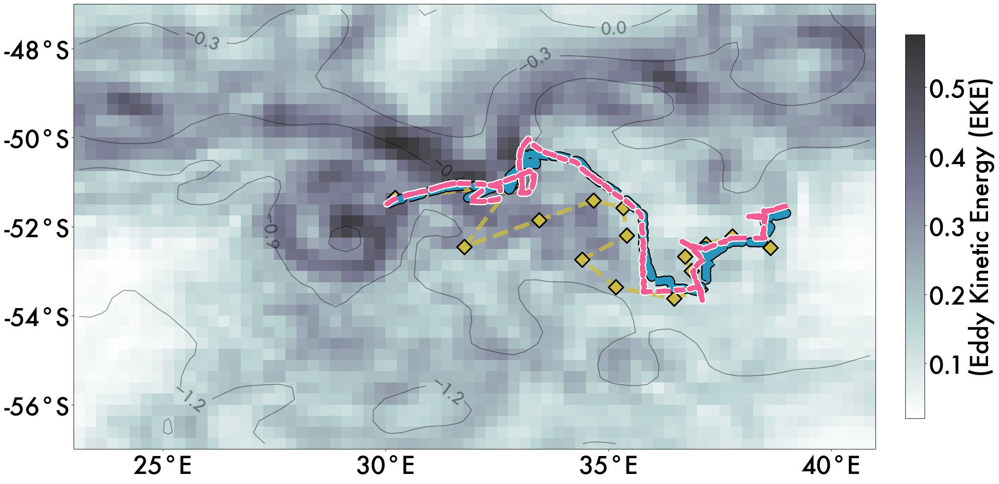

In [2384]:
# LARGE FOR POSTER Plot the averaged EKE over the deployment 120-200

# Make subset
datestart='2019-04-30'
dateend='2019-07-25'
# lat1=-57; lat2=-47
# lon1=19; lon2=41 # (24,22)

lat1=-57; lat2=-47
lon1=23; lon2=41 # (24,22)

data_sat = aviso.sel(time=slice(datestart, dateend))

# Smaller zoom in to low-EKE
data_sat = data_sat.sel(latitude=slice(lat1, lat2))
data_sat = data_sat.sel(longitude=slice(lon1, lon2))

# Make plot
f = plt.figure(figsize=(24,22), layout='constrained') # LARGE FOR POSTER


ax = plt.gca()
ax.set_aspect('equal')
avg_aviso = data_sat.mean(dim='time')

sca = avg_aviso.eke.plot(ax=ax, cmap='bone_r', alpha=0.8, add_colorbar=False)
fig.colorbar(sca, ax=ax, shrink=0.4).set_label('(Eddy Kinetic Energy (EKE)')

contour = ax.contour(avg_aviso['longitude'], avg_aviso['latitude'], avg_aviso['adt'], 
                     colors='k', alpha=0.4, linestyles='solid', zorder=1, levels=4)
ax.clabel(contour, inline=True, fontsize=28)  # Add labels to contour lines

# Plot float
ax.plot(sgfloat.lon,sgfloat.lat, color =  '#CCBB44', alpha=0.8, linewidth=7, linestyle='dashed',
         zorder=3)  # sns.color_palette("Oranges")[3]
ax.scatter(sgfloat.lon,sgfloat.lat, color =  'k', alpha=0.9, s=320, label='float',
           marker='D', edgecolors='k', zorder=3)
ax.scatter(sgfloat.lon,sgfloat.lat, color =  '#CCBB44', alpha=0.9, s=240, label='float',
           marker='D', edgecolors='k', zorder=3)


lw1 = 12
ax.plot(df_659.lon, df_659.lat, color = glid_colors['sg659'], alpha=0.8, linewidth=lw1, linestyle='dashed', label='sg659', 
        path_effects=[pe.Stroke(linewidth=lw1+4, foreground='k'), pe.Normal()], zorder=3) 

ax.plot(df_660.lon, df_660.lat, color = glid_colors['sg660'], alpha=0.8, linewidth=lw1-4, linestyle='dashed', label='sg660', 
        path_effects=[pe.Stroke(linewidth=lw1, foreground='w'), pe.Normal()], zorder=3) 

# Plot rectangle
# rect1 = patch.Rectangle((50,-54),20,6,fill=False,edgecolor='r', alpha=0.8,linewidth=0.6, zorder=3)
# # rect2 = 
# ax.add_patch(rect1)


ax.yaxis.set_major_formatter("{x:1.0f}°S")
# ax.minorticks_off()
# for label in ax.xaxis.get_ticklabels()[::2]:
#     label.set_visible(False)
ax.xaxis.set_ticks([25,30,35,40])
ax.xaxis.set_major_formatter("{x:1.0f}°E")

ax.set_xlabel('')
ax.set_ylabel('')

# ax.legend()
# for front in [SIF, PF]:
#      front = front[(front.lon > 2 ) & (front.lon <66)]
#      ax.scatter(front.lon, front.lat, color= 'w', alpha=0.2, s=40, zorder=3)

# for day in np.arange(150,200,10):
#     plt.scatter(dav_660.lon.loc[i].values, dav_660.lat.loc[i].values, marker='X', s=200, color='k', alpha=0.9, zorder=4)

Text(0, 0.5, '')

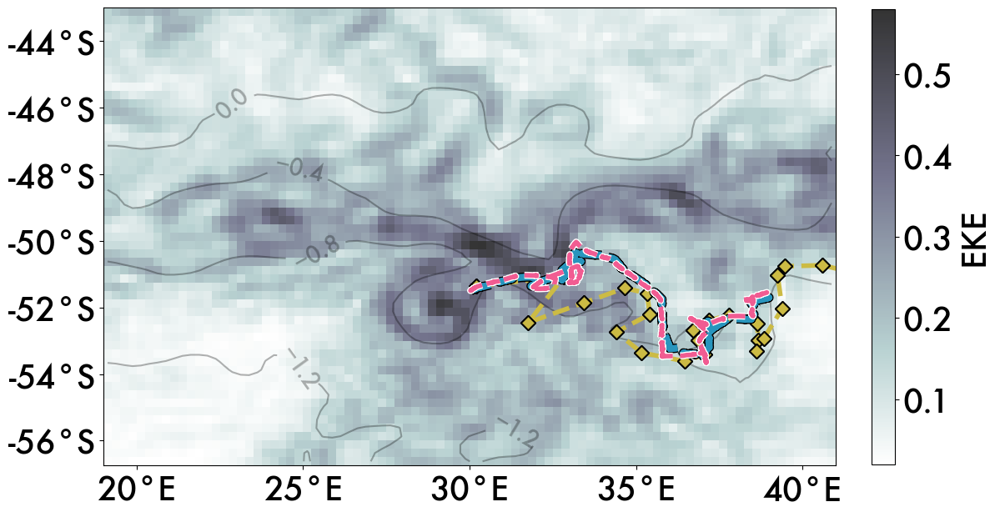

In [285]:
# prep for paper SUBPLOT 1: Plot the averaged EKE over the deployment 120-200

# Make subset
datestart='2019-04-30'
dateend='2019-07-25'
lat1=-56.8; lat2=-43
lon1=19; lon2=41
   
data_sat = aviso.sel(time=slice(datestart, dateend))

# Smaller zoom in to low-EKE
data_sat = data_sat.sel(latitude=slice(lat1, lat2))
data_sat = data_sat.sel(longitude=slice(lon1, lon2))

# Make plot
f = plt.figure(figsize=(12,11), layout='constrained') # LARGE FOR POSTER


ax = plt.gca()
ax.set_aspect('equal')
avg_aviso = data_sat.mean(dim='time')

#background EKE
sca = avg_aviso.eke.plot(ax=ax, cmap='bone_r', alpha=0.8, add_colorbar=False, vmin=0.02, vmax=0.58)
fig.colorbar(sca, ax=ax, shrink=0.5).set_label('EKE')

contour = ax.contour(avg_aviso['longitude'], avg_aviso['latitude'], avg_aviso['adt'], 
                     colors='k', alpha=0.3, linestyles='solid', zorder=1, levels=4)
ax.clabel(contour, inline=True, fontsize=20)  # Add labels to contour lines

# Plot float
ax.plot(sgfloat.lon,sgfloat.lat, color =  '#CCBB44', alpha=1, linewidth=4, linestyle='dashed',
        label='float', zorder=3)  # sns.color_palette("Oranges")[3]
ax.scatter(sgfloat.lon,sgfloat.lat, color =  '#CCBB44', alpha=0.9, s=70, 
           marker='D', edgecolors='k', zorder=3)

# Gliders
ax.plot(df_659.lon, df_659.lat, color = glid_colors['sg659'], alpha=0.8, linewidth=6, linestyle='dashed', label='sg659', 
        path_effects=[pe.Stroke(linewidth=8, foreground='k'), pe.Normal()], zorder=3) 

ax.plot(df_660.lon, df_660.lat, color = glid_colors['sg660'], alpha=0.8, linewidth=4, linestyle='dashed', label='sg660', 
        path_effects=[pe.Stroke(linewidth=6, foreground='w'), pe.Normal()], zorder=3) 

ax.yaxis.set_major_formatter("{x:1.0f}°S")
ax.xaxis.set_major_formatter("{x:1.0f}°E")
ax.set_xlabel('')
ax.set_ylabel('')
# for front in [SIF, PF]:
#      front = front[(front.lon > 2 ) & (front.lon <66)]
#      ax.scatter(front.lon, front.lat, color= 'w', alpha=0.2, s=40, zorder=3)

# for day in np.arange(150,200,10):
#     plt.scatter(dav_660.lon.loc[i].values, dav_660.lat.loc[i].values, marker='X', s=200, color='k', alpha=0.9, zorder=4)

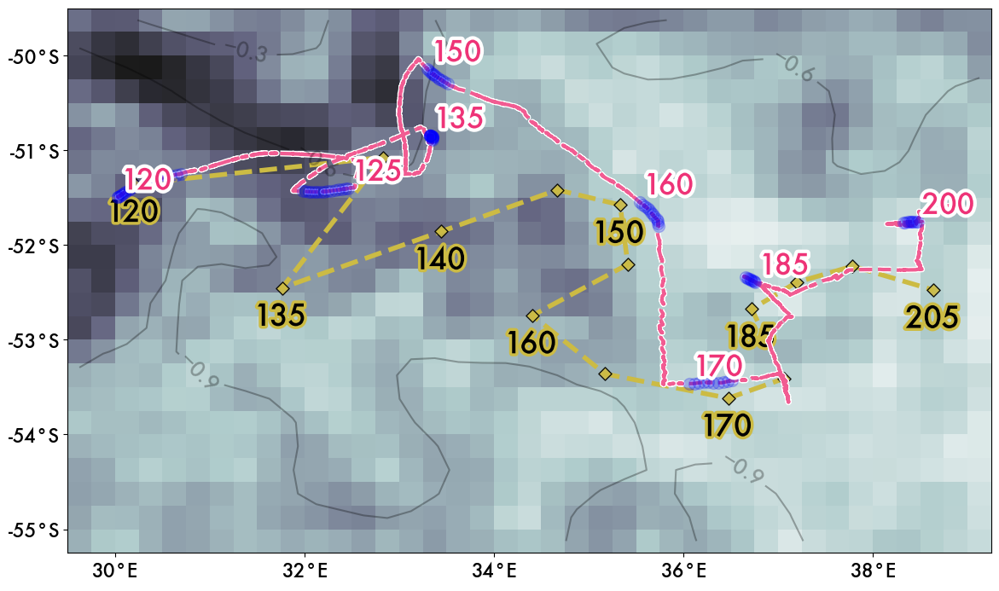

In [46]:
# SHOW LABELED THROUGHOUT DEPLOYMENT
# Make subset
datestart='2019-04-30'
dateend='2019-07-25'
lat1=-55.2; lat2=-49.5
lon1=29.5; lon2=39.2
data_sat = aviso.sel(time=slice(datestart, dateend))
data_sat = data_sat.sel(latitude=slice(lat1, lat2))
data_sat = data_sat.sel(longitude=slice(lon1, lon2))


# MAKE FIG
f = plt.figure(figsize=(12,10), layout='tight')
ax = plt.gca()

avg_aviso_full = data_sat.mean(dim='time')
# Plot float
ax.plot(dav_float.lon,dav_float.lat, color =  '#CCBB44', alpha=1, linewidth=4, linestyle='dashed',
    label='float', zorder=3)  # sns.color_palette("Oranges")[3]
ax.scatter(dav_float.lon.values,dav_float.lat.values, color =  '#CCBB44', alpha=0.9, s=60, 
        marker='D', edgecolors='k', zorder=3)
    
for ind, day in enumerate([int(x) for x in dav_float.yearday.values]):
        if day in ([120,135,140,150, 160, 170, 185, 205]):
            ax.text(dav_float.lon.loc[ind]-.3, dav_float.lat.loc[ind]-.4, str(day), 
                        fontsize=25, color='k',
         path_effects=[pe.Stroke(linewidth=5, foreground='#CCBB44'), pe.Normal()], zorder=3)

# Plot Glider
ax.plot(df_660.lon, df_660.lat, color = glid_colors['sg660'], alpha=0.8, linewidth=3, linestyle='dashed', label='sg660',
         path_effects=[pe.Stroke(linewidth=5, foreground='w'), pe.Normal()], zorder=3) 

# Plot every 10th glider position
for day in [120,125,135, 150, 160, 170, 185, 200]:
    i = np.where(dav_660.yearday.round()==day)
    ax.scatter(dav_660.lon.loc[i].values, dav_660.lat.loc[i].values, s=100, color='b', alpha=0.2, zorder=3)
    ax.text(dav_660.lon.loc[i].values[0]+.04, dav_660.lat.loc[i].values[0]+0.08, str(day), 
                fontsize=24, color=glid_colors['sg660'],
         path_effects=[pe.Stroke(linewidth=6, foreground='w'), pe.Normal()], zorder=3)


# Plot EKE
sca = avg_aviso_full.eke.plot(ax=ax, cmap='bone_r', alpha=0.9, add_colorbar=False, zorder=0, vmin=0.02, vmax=0.58)
# fig.colorbar(sca, ax=ax).set_label('EKE')

# Plot ADT Contours
contour = ax.contour(avg_aviso_full['longitude'], avg_aviso_full['latitude'], avg_aviso_full['adt'], 
                     colors='k', alpha=0.3, linestyles='solid', zorder=1, levels=2)
ax.clabel(contour, inline=True, fontsize=18)  # Add labels to contour lines

# Format Axes
ax.yaxis.set_major_formatter("{x:1.0f}°S")
ax.xaxis.set_major_formatter("{x:1.0f}°E")
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')

# 
    
# cb = plt.colorbar()


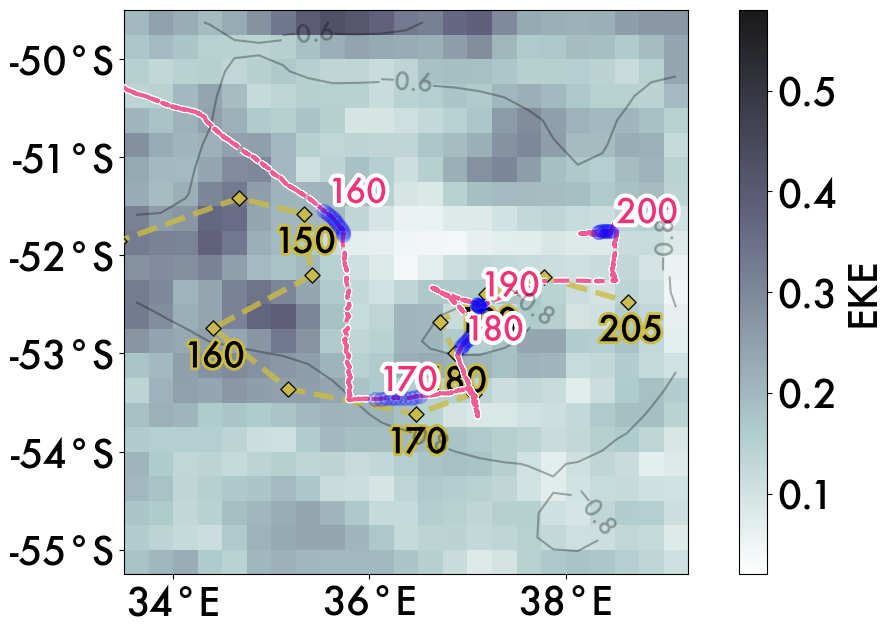

In [281]:
# Plot the LOW EKE (yd>170) averaged EKE to understand yearday 170

# Make subset
datestart='2019-05-31'
dateend='2019-07-25'
lat1=-55.2; lat2=-49.5
lon1=33.4; lon2=39.2
   
data_sat = aviso.sel(time=slice(datestart, dateend))

# Smaller zoom in to low-EKE
data_sat = data_sat.sel(latitude=slice(lat1, lat2))
data_sat = data_sat.sel(longitude=slice(lon1, lon2))

# START FIGURE
f = plt.figure(figsize=(11,7), layout='tight')
ax = plt.gca()
avg_aviso = data_sat.mean(dim='time')

# Plot float
ax.plot(dav_float.lon,dav_float.lat, color =  '#CCBB44', alpha=0.8, linewidth=4, linestyle='dashed',
    label='float', zorder=3)  # sns.color_palette("Oranges")[3]
ax.scatter(dav_float.lon.values,dav_float.lat.values, color =  '#CCBB44', alpha=0.9, s=60, 
        marker='D', edgecolors='k', zorder=3)
    
for ind, day in enumerate([int(x) for x in dav_float.yearday.values]):
        if day in ([150,160,170,180,190,205]):
            ax.text(dav_float.lon.loc[ind]-.3, dav_float.lat.loc[ind]-.4, str(day), 
                        fontsize=25, color='k',
         path_effects=[pe.Stroke(linewidth=4, foreground='#CCBB44'), pe.Normal()], zorder=3)

# Plot Glider
ax.plot(df_660.lon, df_660.lat, color = glid_colors['sg660'], alpha=0.8, linewidth=3, linestyle='dashed', label='sg660',
         path_effects=[pe.Stroke(linewidth=5, foreground='w'), pe.Normal()], zorder=3) 

# Plot every 10th glider position
for day in np.arange(160,210,10):
    i = np.where(dav_660.yearday.round()==day)
    ax.scatter(dav_660.lon.loc[i].values, dav_660.lat.loc[i].values, s=100, color='b', alpha=0.2, zorder=3)
    ax.text(dav_660.lon.loc[i].values[0]+.04, dav_660.lat.loc[i].values[0]+0.08, str(day), 
                fontsize=24, color=glid_colors['sg660'],
         path_effects=[pe.Stroke(linewidth=6, foreground='w'), pe.Normal()], zorder=3)


# Plot EKE
sca = avg_aviso.eke.plot(ax=ax, cmap='bone_r', alpha=0.9, add_colorbar=False, zorder=0, vmin=0.02, vmax=0.58)
fig.colorbar(sca, ax=ax).set_label('EKE')

# Plot ADT Contours
contour = ax.contour(avg_aviso['longitude'], avg_aviso['latitude'], avg_aviso['adt'], 
                     colors='k', alpha=0.3, linestyles='solid', zorder=1, levels=2)
ax.clabel(contour, inline=True, fontsize=18)  # Add labels to contour lines

# Format Axes
ax.yaxis.set_major_formatter("{x:1.0f}°S")
ax.xaxis.set_major_formatter("{x:1.0f}°E")
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')

# 
    
# cb = plt.colorbar()


## ANIMATION

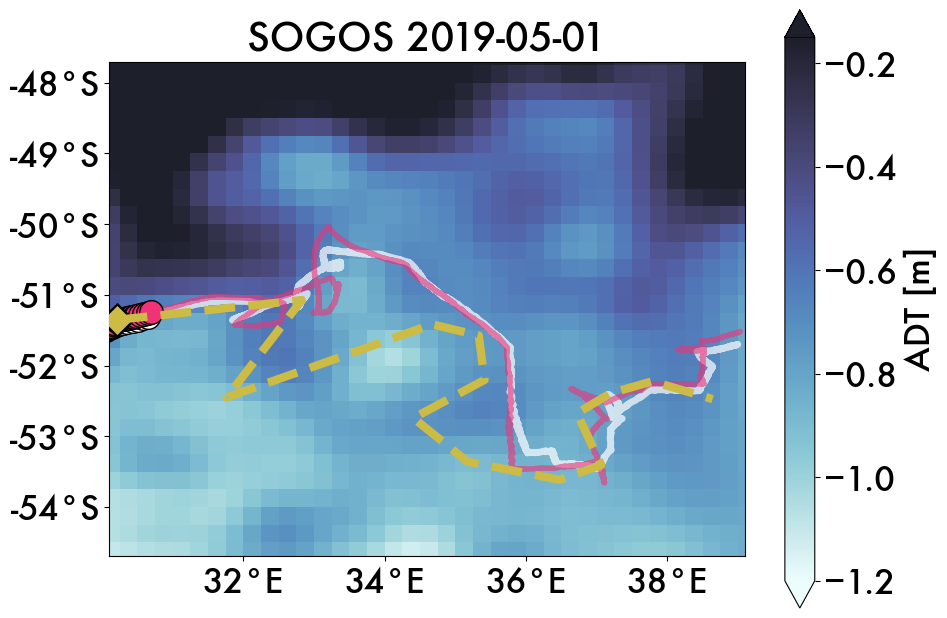

In [87]:
# Full deployment gif: evising with yearday label and expanding plotted region. 09282023
# All gliders and float data
# aviso is the aviso SLA data

file_path = '../animation/'
fname = 'ADT_allplat_labeled_yd'
savefig = False

# daylist = [131, 137, 150] # np.arange(131,138,1)
daylist = np.arange(120,200,1)
for day in [120]:
    fig = plt.figure(figsize=(10,7))
    ax = fig.gca()

    aviso.adt.attrs={'long_name':'Sea Surface Height [m]'}
    dat = aviso.sel(time=sg.ytd2datetime(day), method='nearest')
    map = dat.adt.plot(cmap=cmo.ice_r, vmin=-1.2, vmax=-.15, zorder=1, alpha=0.9) #, add_colorbar=False)

    plt.title('SOGOS ' + str(sg.ytd2datetime(day)), fontsize=28)

    # Plot glider paths
    # ax.plot(dav_660.lon, dav_660.lat, linewidth=4, color=plat_colors['sg660'], alpha=0.5)
    ax.plot(sg659.lon, sg659.lat, color = 'white', alpha=.7, linewidth=5, label='sg659', zorder=3) #,
            # path_effects=[pe.Stroke(linewidth=7, foreground='k'), pe.Normal()], zorder=3) 
    ax.plot(sg660.lon, sg660.lat, color = plat_colors['sg660'], alpha=.6, linewidth=4, label='sg660', zorder=3) #, 
            # path_effects=[pe.Stroke(linewidth=6, foreground='k'), pe.Normal()]) 

    # # Plot points of glider on that day
    i = np.where(dav_659.yearday.round()==day)
    ax.scatter(dav_659.lon.iloc[i], dav_659.lat.iloc[i], 290, color='white', label = '659', zorder=3, alpha=1, edgecolors='k') # marker='o', markeredgecolor='k')
    i = np.where(dav_660.yearday.round()==day)
    ax.scatter(dav_660.lon.iloc[i], dav_660.lat.iloc[i], 290, color=plat_colors['sg660'], label = '660', zorder=3, alpha=1, edgecolors='k')

    # Plot nearest argo float location

    dayfloat = dav_float[dav_float.yearday.round()==(day // 5) * 5]  # use floor function to round day to nearest 5 day, to match argo
    ax.scatter(dayfloat.lon, dayfloat.lat, s=290, color='k', alpha=1, marker='D', edgecolors='k', label='argo', zorder=3)
    ax.scatter(dayfloat.lon, dayfloat.lat, s=250, color=plat_colors['float'], alpha=1, marker='D', edgecolors='k', label='argo', zorder=3)
    ax.plot(dav_float.lon, dav_float.lat, linewidth=6,  linestyle='dashed', color=plat_colors['float'], alpha=1, zorder=3)

    # ax.set_ylim([-54.7, -47.7])
    # ax.set_xlim([29.1, 40.1])  #39.1

    ax.set_ylim([-54.7, -47.7])
    ax.set_xlim([30.1, 39.1])  #39.1


    ax.set_aspect('equal')
    ax.yaxis.set_major_formatter("{x:1.0f}°S")
    ax.xaxis.set_major_formatter("{x:1.0f}°E")

    ax.set_ylabel('')
    ax.set_xlabel('')
    # plt.legend(facecolor='white', labelcolor='white', framealpha=0.2)

    plt.tight_layout()
    if savefig:
        plt.savefig(file_path + fname + str(day) + '.png', format='png')
        # print('saved')
        plt.close()

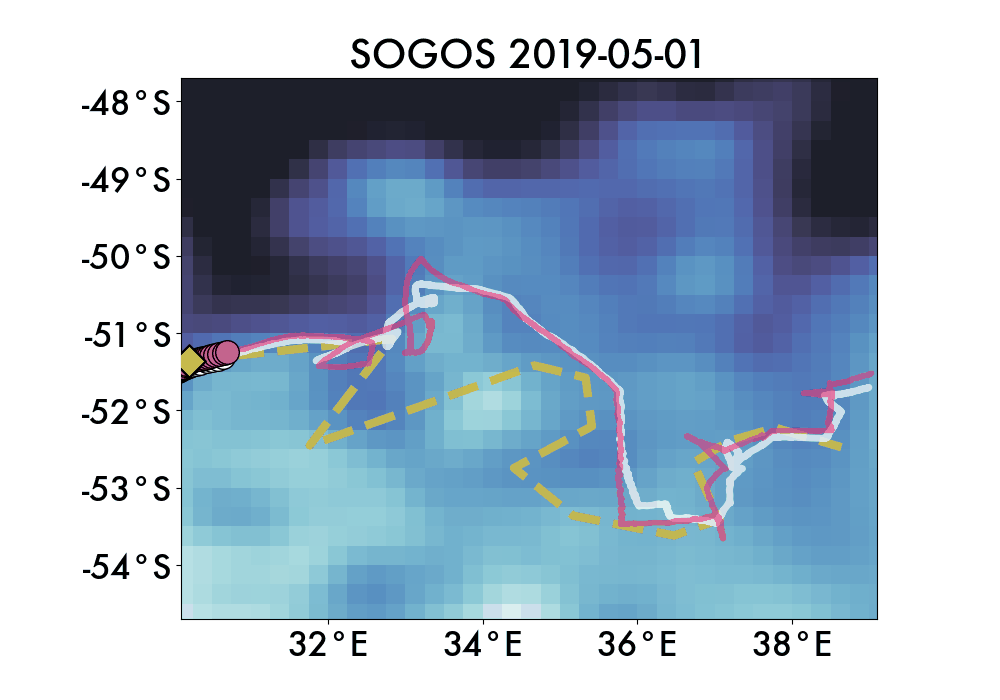

In [86]:
# from IPython.display import Image
gifname = 'allplat_labeled_yd'
png_dir = '../animation/'


images = []
for file_name in sorted(os.listdir(png_dir)):
    if file_name.startswith(gifname):
        file_path = os.path.join(png_dir, file_name)
        images.append(iio.imread(file_path))

# Make it pause at the end so that the viewers can ponder
for _ in range(2):
    images.append(iio.imread(file_path))

# Save them as frames into a gif 
exportname = png_dir + gifname + 'movie.gif'
kargs = { 'duration': .1 }
iio.mimsave(exportname, images, 'GIF', **kargs)

Image(png_dir + gifname + 'movie.gif') 
# Image(png_dir + 'adt_movie.gif')

# RFR Argo Training Data Maps

/opt/homebrew/Caskroom/mambaforge/base/envs/mlsogos/lib/python3.8/site-packages/labellines/core.py:148: UserWarning: Tried to label line Line2D(_child4), but could not find a label for it.
  warnings.warn(


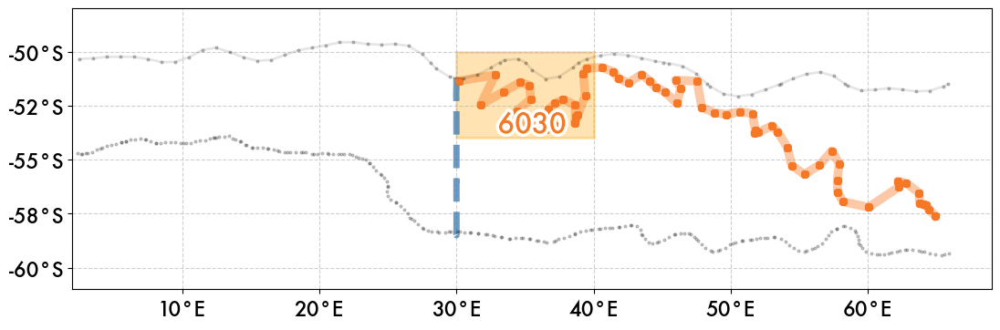

In [191]:
# save = True

fig = plt.figure(figsize=(13,4))
# fig = plt.figure(figsize=(11,3))
ax=plt.gca()

# for wmo in wmoids[wmoids!=5906030]:
#     ax.plot(floatDF[floatDF.wmoid==wmo].lon,floatDF[floatDF.wmoid==wmo].lat,
#             color = wmo_colors[wmo], alpha=0.2, linewidth=5, label=str(wmo)[3:], zorder=3)
#     ax.scatter(floatDF[floatDF.wmoid==wmo].lon,floatDF[floatDF.wmoid==wmo].lat,
#             color = wmo_colors[wmo], alpha=0.1, s=30, zorder=3)

for wmo in [5906030]:
    ax.plot(floatDF[floatDF.wmoid==wmo].lon,floatDF[floatDF.wmoid==wmo].lat,
            color = sns.color_palette("Oranges")[3], alpha=0.4, linewidth=7, label=str(wmo)[3:], zorder=3)  # sns.color_palette("Oranges")[3]
    ax.scatter(floatDF[floatDF.wmoid==wmo].lon,floatDF[floatDF.wmoid==wmo].lat,
            color = sns.color_palette("Oranges")[3], alpha=0.1, s=30, zorder=3)

for front in [SIF, PF]:
     front = front[(front.lon > 2 ) & (front.lon <66)]
     ax.scatter(front.lon, front.lat, color='k', alpha=0.2, s=4, zorder=3)
for front in [PF]:
     front = front[(front.lon > 2 ) & (front.lon <66)] 
     ax.plot(front.lon, front.lat, color='k', alpha=0.1, linewidth=2, zorder=3)

# plt.title('BGC-Argo Training Data')
# plt.title('Argo Yeardays: ' + str(start_yd) + ' to ' + str(end_yd))
rect = patch.Rectangle((30,-54),10,4, fill=True, color="orange", alpha=0.3,linewidth=2, zorder=1)

# ax.legend()
ax.add_patch(rect)
ax.set_xlim(2,69)
ax.set_ylim(-61,-48)
# ax.set_aspect('equal')

ax.yaxis.set_major_formatter("{x:1.0f}°S")
ax.xaxis.set_major_formatter("{x:1.0f}°E")

ax.grid(linestyle='dashed', alpha=0.6, zorder=1)

lines = ax.get_lines()
labelLines(lines, align=False, fontsize=22, zorder=3)
# labelLines(lins) # , align=False, fontsize=18)
plt.plot(shipDF.lon, shipDF.lat, alpha=0.8, linestyle='dashed', c='steelblue', linewidth=5)

# if save:
#         plt.savefig('../figures/Argo_simple_region_map.png', dpi=300)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


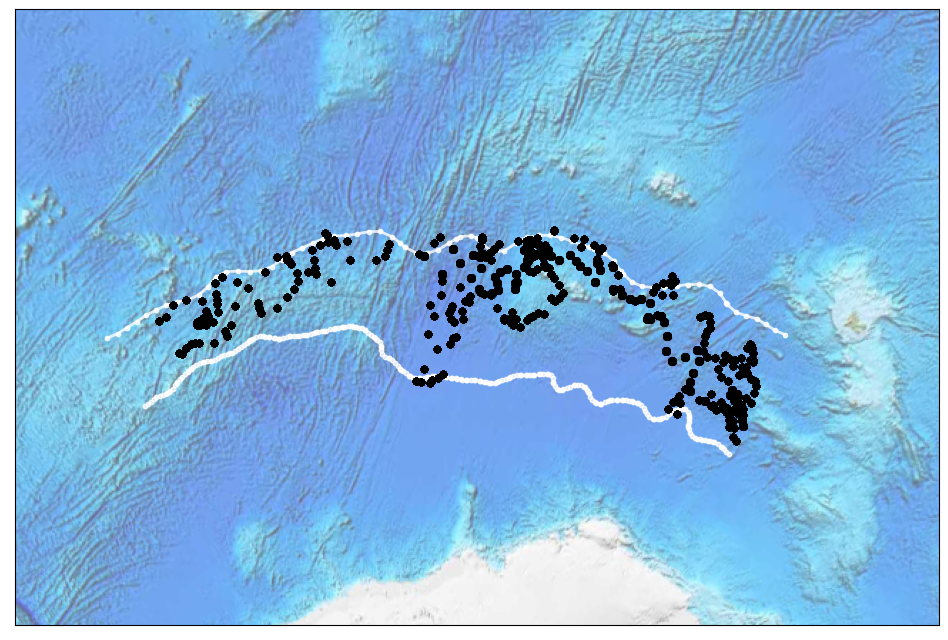

In [480]:
# from mpl_toolkits.basemap import Basemap
fig = plt.figure(figsize=(14,8))
m = Basemap(width=6000000,height=4000000,projection='lcc',
            resolution='c',lat_1=-65.,lat_0=-55, lon_1 = 70, lon_0=35.)

# fig = plt.figure(figsize=(14, 7), edgecolor='w')
# m = Basemap(projection='cyl', resolution=None,
#             llcrnrlat=-65, urcrnrlat=-40,
#             llcrnrlon=0, urcrnrlon=70)

m.etopo(scale=0.8, alpha=0.6)

for wmo in wmoids[wmoids!=5906030]:
    wmodat = floatDF[floatDF.wmoid==wmo]
    lon = wmodat.lon.values
    lat = wmodat.lat.values

    xpt, ypt=m(lon,lat)
    # m.plot(xpt, ypt, color = 'w', linewidth=5, alpha=0.2, label=str(wmo)[3:], zorder=3) # wmo_colors[wmo]
    m.scatter(xpt, ypt , color = 'k', alpha=0.3, s=20, zorder=3)

for front in [SIF]:
     front = front[(front.lon > 0 ) & (front.lon <65)]
     lon = front.lon.values
     lat = front.lat.values
     xpt, ypt = m(lon, lat)
     m.scatter(xpt, ypt, color='w', alpha=0.8, s=10, zorder=2)
#      ax.plot(front.lon, front.lat, color='k', alpha=0.1, linewidth=2, zorder=3)

for front in [PF]:
     front = front[(front.lon > 0 ) & (front.lon <65)]
     lon = front.lon.values
     lat = front.lat.values
     xpt, ypt = m(lon, lat)
     m.scatter(xpt, ypt, color='w', alpha=0.8, s=10, zorder=2)
     m.plot(xpt, ypt, color='w', alpha=0.8, linewidth=2, zorder=2)


# Plot the float
sgfloat = floatDF[floatDF.wmoid==5906030]
lon = sgfloat.lon.values
lat = sgfloat.lat.values
xpt, ypt=m(lon,lat)

# m.plot(xpt, ypt, color = 'k', alpha=0.4, linewidth=7, label=str(5906030)[3:], zorder=3)
m.scatter(xpt, ypt , color = 'k', alpha=0.1, s=30, zorder=3)


# Plot the glider
# glid = df_659
# lon = glid.lon.values
# lat = glid.lat.values
# xpt, ypt=m(lon,lat)
# m.plot(xpt, ypt, color = 'r', alpha=0.4, linewidth=7, label=str(5906030)[3:], zorder=3)
# m.scatter(xpt, ypt , color = 'r', alpha=0.1, s=30, zorder=3)

plt.show() 

/opt/homebrew/Caskroom/mambaforge/base/envs/mlsogos/lib/python3.8/site-packages/labellines/core.py:204: UserWarning: The value at position 0 in `xvals` is outside the range of its associated line (xmin=28.246, xmax=33.568, xval=27.35). Clipping it into the allowed range.
  warnings.warn(
/opt/homebrew/Caskroom/mambaforge/base/envs/mlsogos/lib/python3.8/site-packages/labellines/core.py:204: UserWarning: The value at position 5 in `xvals` is outside the range of its associated line (xmin=56.495, xmax=64.896, xval=50.3). Clipping it into the allowed range.
  warnings.warn(


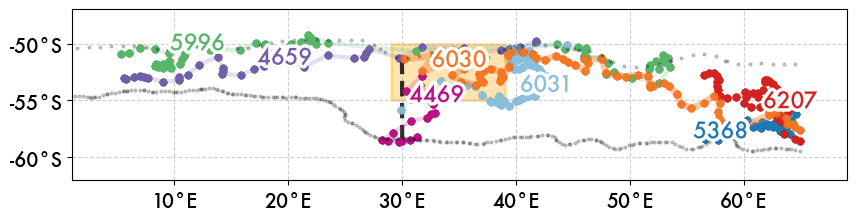

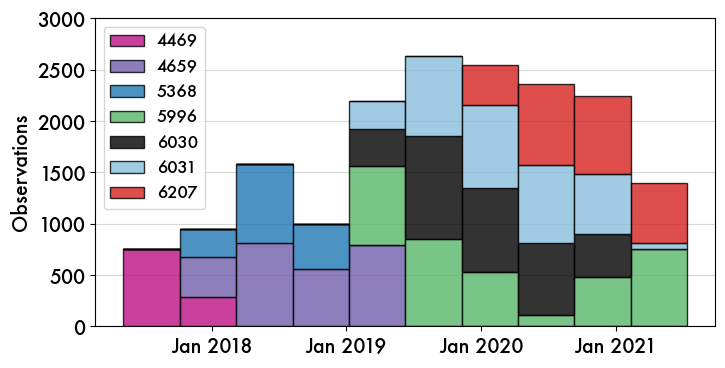

In [6]:
# Paper Fig: 
reload(sgplot)
# fig, axs = plt.subplots(2,1, figsize=(8,6), constrained_layout='True')
sgplot.training_float_map(floatDF, fsize=(10,8));
sgplot.argo_time_coverage(floatDF, fsize=(8,4), fontsize=12);

# RFR Training Plots

Text(0.5, 1.0, 'Correlation Heatmap')

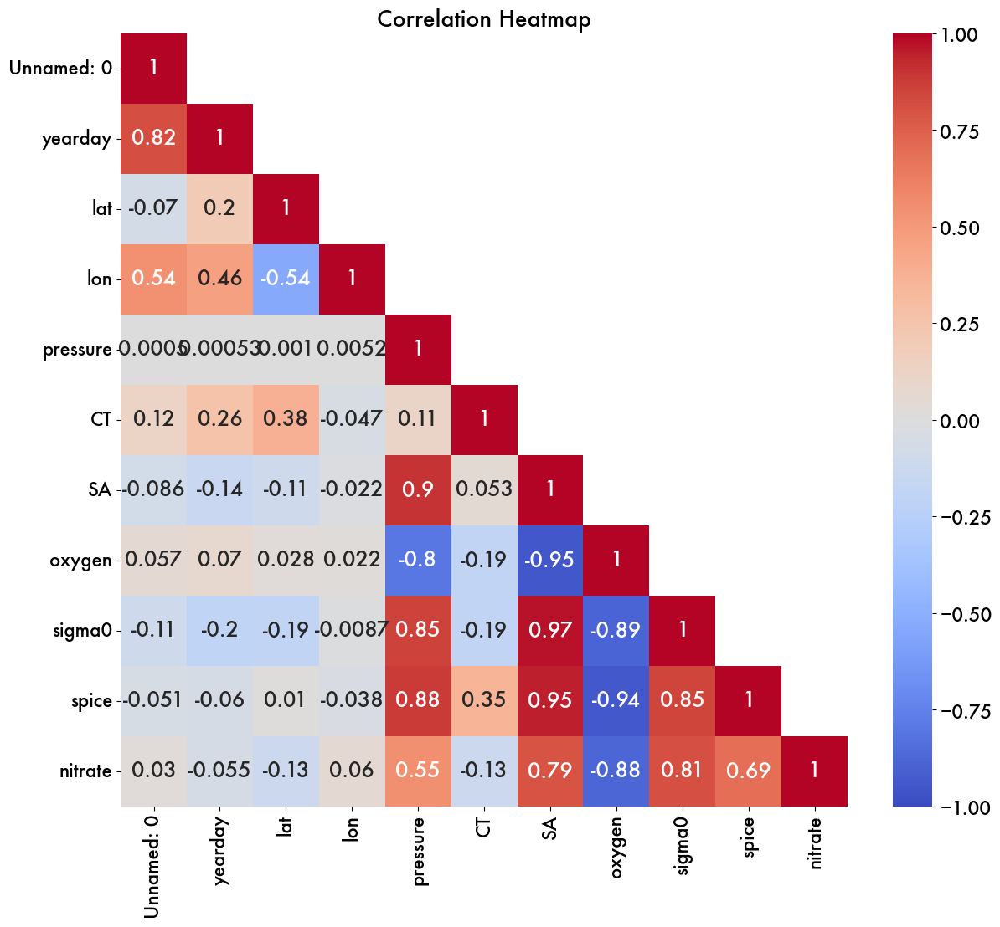

In [192]:
# Correlation map
dfcorr = floatDF.drop({'log_buoyancy', 'wmoid', 'mncos', 'mnsin', 'profid', 'month', 'dist_maxb', 'o2sat'},axis=1).corr()
# plot a heatmap with annotation

plt.figure(figsize=(14,12))
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(dfcorr, dtype=bool),k=1)
hm = sns.heatmap(dfcorr, mask=mask, annot=True, cmap='coolwarm', annot_kws={"size": 18}, center=0, vmin=-1, vmax=1)
plt.title('Correlation Heatmap')

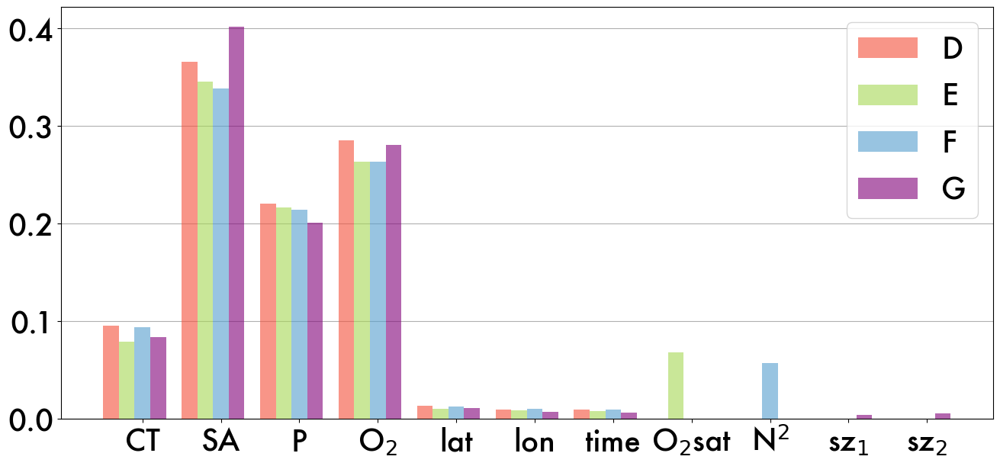

In [162]:
# Feature importance: Make side by side comp between model (grouped by variable)
save=False
fig = plt.figure(figsize=(13,6), layout='constrained')
ax = fig.gca()

barwidth=.8

# # plot the simple ones
# modlist = model_list[:4]
# varslist = allvars[:-4]
# xlabel = [r'$\tau$', r'$\rho$', 'CT', 'SA', 'P', 'O$_2$', 'lat', 'lon', 'time']

# plot the complex ones
modlist = model_list[3:]
varslist = allvars[2:]
xlabel = ['CT', 'SA', 'P', 'O$_2$', 'lat', 'lon', 'time',
                    'O$_2$sat','N$^2$', 'sz$_{1}$', 'sz$_{2}$']

# Result of plot method
xind = dict.fromkeys(modlist)
xind[modlist[0]] = np.arange(len(varslist))*len(modlist)

for i in range(len(modlist)-1):
    xind[modlist[i+1]] = [x + barwidth for x in xind[modlist[i]]]

for modtag in modlist:
    ax.bar(xind[modtag], RF_featimps[varslist].loc[modtag].to_numpy(), color = model_palettes[modtag], alpha=0.6, label = modtag[-1], zorder=3)

ax.grid(axis='y', zorder=0)
ax.legend(loc='upper right', fontsize=28)


ax.set_xticks(xind[modlist[2]])
ax.set_xticklabels(varslist)
ax.set_xticklabels(xlabel)

        # 'o2sat','log(N2)', 'mncos', 'mnsin'])
# ax.set_title('Feature Importances')

if save:
    plt.savefig('../figures/FeatureImportance_complexmodels.png')
    # plt.savefig('../figures/FeatureImportance_simplemodels.png')

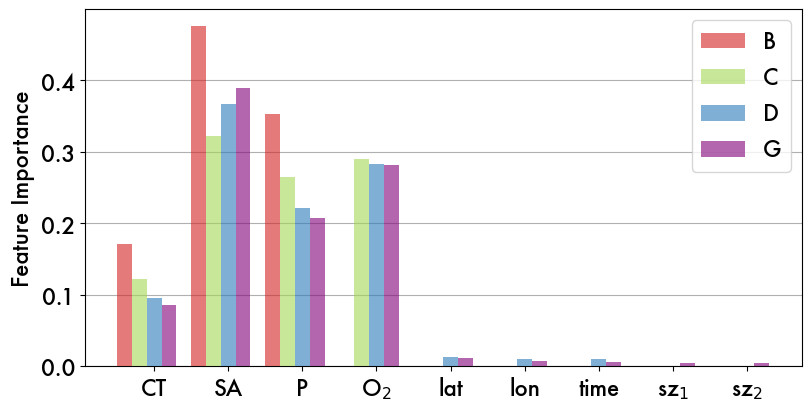

In [200]:
# FEAT IMPS FOR PAPER: Subset of models B, C, D, G
save=False
fig = plt.figure(figsize=(8,4), layout='constrained')
ax = fig.gca()
barwidth=.8

modlist = ['Model_B', 'Model_C', 'Model_D', 'Model_G']
varslist = ['CT', 'SA', 'pressure', 'oxygen', 'lat', 'lon', 'yearday','ydcos', 'ydsin']
xlabel = ['CT', 'SA', 'P', 'O$_2$', 'lat', 'lon', 'time', 'sz$_{1}$', 'sz$_{2}$']

# # plot the simple ones
# modlist = model_list[:4]
# varslist = allvars[:-4]
# xlabel = [r'$\tau$', r'$\rho$', 'CT', 'SA', 'P', 'O$_2$', 'lat', 'lon', 'time']

# plot the complex ones
# modlist = model_list[3:]
# varslist = allvars[2:]
# xlabel = ['CT', 'SA', 'P', 'O$_2$', 'lat', 'lon', 'time',
#                     'O$_2$sat','N$^2$', 'sz$_{1}$', 'sz$_{2}$']

# Result of plot method
xind = dict.fromkeys(modlist)
xind[modlist[0]] = np.arange(len(varslist))*len(modlist)

for i in range(len(modlist)-1):
    xind[modlist[i+1]] = [x + barwidth for x in xind[modlist[i]]]

for modtag in modlist:
    ax.bar(xind[modtag], RF_featimps[varslist].loc[modtag].to_numpy(), color = model_palettes[modtag], alpha=0.6, label = modtag[-1], zorder=3)

ax.grid(axis='y', zorder=0)
ax.legend(loc='upper right', fontsize=16)
ax.set_ylabel('Feature Importance', fontsize=16)

ax.set_xticks(xind[modlist[2]])
ax.set_xticklabels(varslist)
ax.set_xticklabels(xlabel)

        # 'o2sat','log(N2)', 'mncos', 'mnsin'])
# ax.set_title('Feature Importances')

if save:
    plt.savefig('../figures/FeatureImportance_complexmodels.png')
    # plt.savefig('../figures/FeatureImportance_simplemodels.png')

# RFR Error Scatterplots

Text(0, 0.5, 'CT')

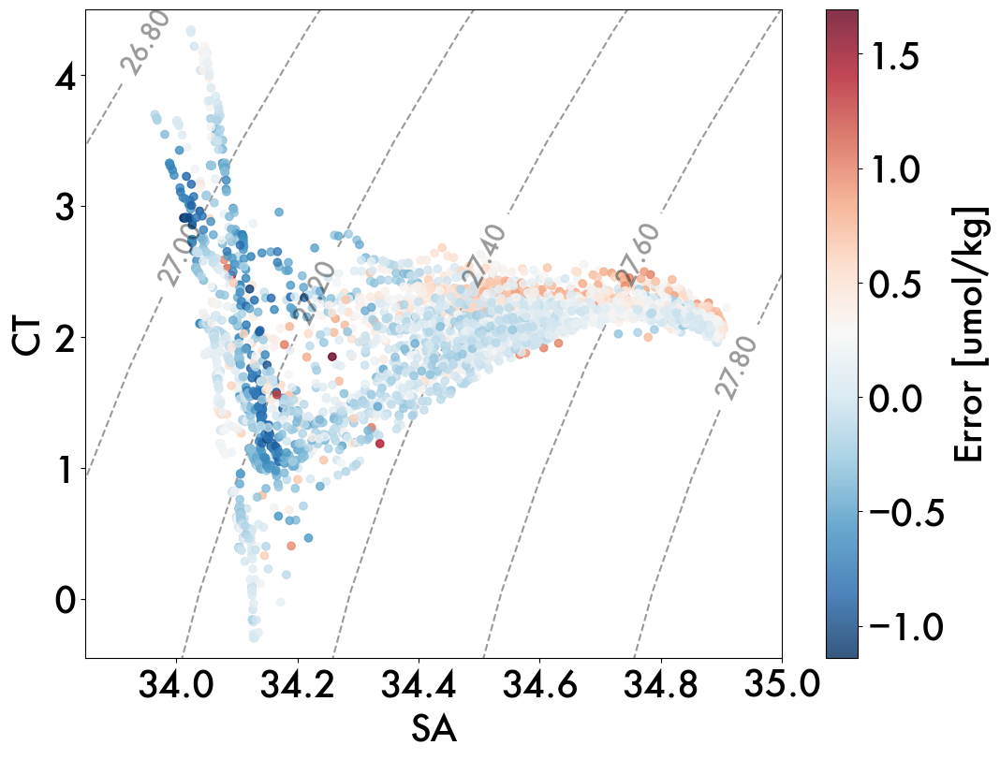

In [ ]:
# Errors in TS Space
df = RF_test['Model_G']
modtag = 'Model G'

fig = plt.figure(figsize=(12,9))
ax = fig.gca()
plt.scatter(df.SA, df.CT, c=df.test_error, cmap='RdBu_r', alpha=0.8, zorder=3)  # , vmin=-5, vmax=5
plt.colorbar().set_label('Error [umol/kg]')
plt.show

# Add density contours
# Figure out boudaries (mins and maxs)
smin = df.SA.min() -.3
smax = df.SA.max() +.3

tmin= df.CT.min() - 1.5
tmax = df.CT.max() + 0.9

# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens = np.zeros((ydim,xdim))
 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin

# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        dens[j,i]=gsw.sigma0(si[i],ti[j])

CS = ax.contour(si,ti,dens, linestyles='dashed', colors='k', alpha=0.4, zorder=1)
ax.clabel(CS, fontsize=20, fmt='%1.2f')
ax.set_ylim(-0.45,4.5)
ax.set_xlim(33.85, 35.0)

ax.set_xlabel('SA')
ax.set_ylabel('CT')
# ax.set_title('Test Prediction Errors ' + modtag)


(400.0, 0.0)

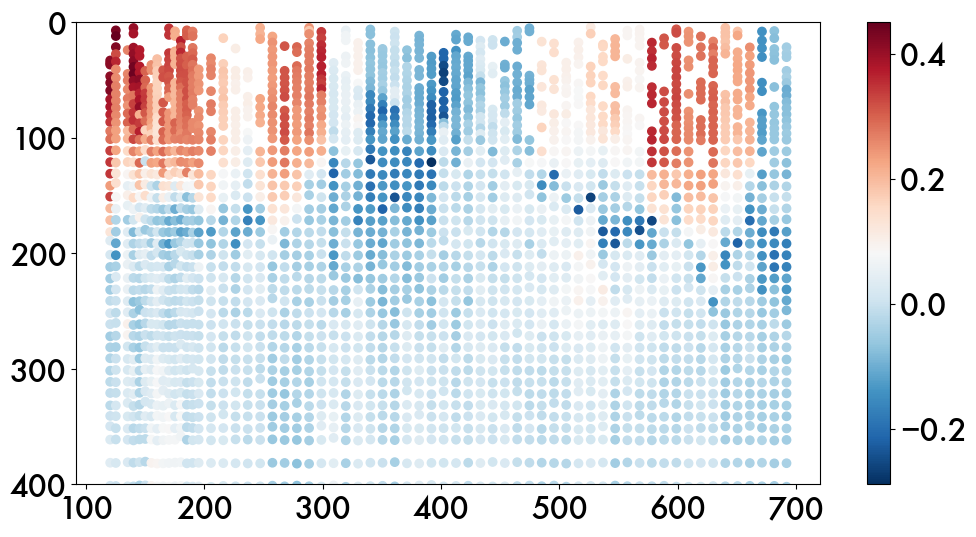

In [1353]:

tip = RF_test['Model_G'].copy()
tip['difference_E'] = RF_test['Model_G'].test_prediction - RF_test['Model_E'].test_prediction
tip['difference_F'] = RF_test['Model_G'].test_prediction - RF_test['Model_F'].test_prediction
tip['difference_D'] = RF_test['Model_G'].test_prediction - RF_test['Model_D'].test_prediction
fig = plt.figure(figsize=(12,6))
ax = fig.gca()

sca = ax.scatter(tip.yearday, tip.pressure, c=tip.difference_D, cmap='RdBu_r')
plt.colorbar(sca, ax=ax)
ax.invert_yaxis()
ax.set_ylim([400,0])

In [1245]:
print_error_depths(CANYON_pred, var='prediction_error', pres_lim = [0,1000])

Errors between depths 0 to 1000:
Yeardays: 0 to 365:
median abs error: 	0.8342413246739007
mean abs error 		1.0436722672327097

95% of errors fall between:
-2.43148 to 0.35023

During SOGOS between depths 0 to 1000:
95% of errors fall between:
-2.20316 to 0.23579


In [1247]:
print_error_depths(RF_test['Model_G'], var='test_relative_error', pres_lim = [0,1000], )

Errors between depths 0 to 1000:
Yeardays: 0 to 365:
median abs error: 	0.0105429370303075
mean abs error 		0.011928687235112622

95% of errors fall between:
-0.0262 to 0.03213

During SOGOS between depths 0 to 1000:
95% of errors fall between:
-0.02628 to 0.03663


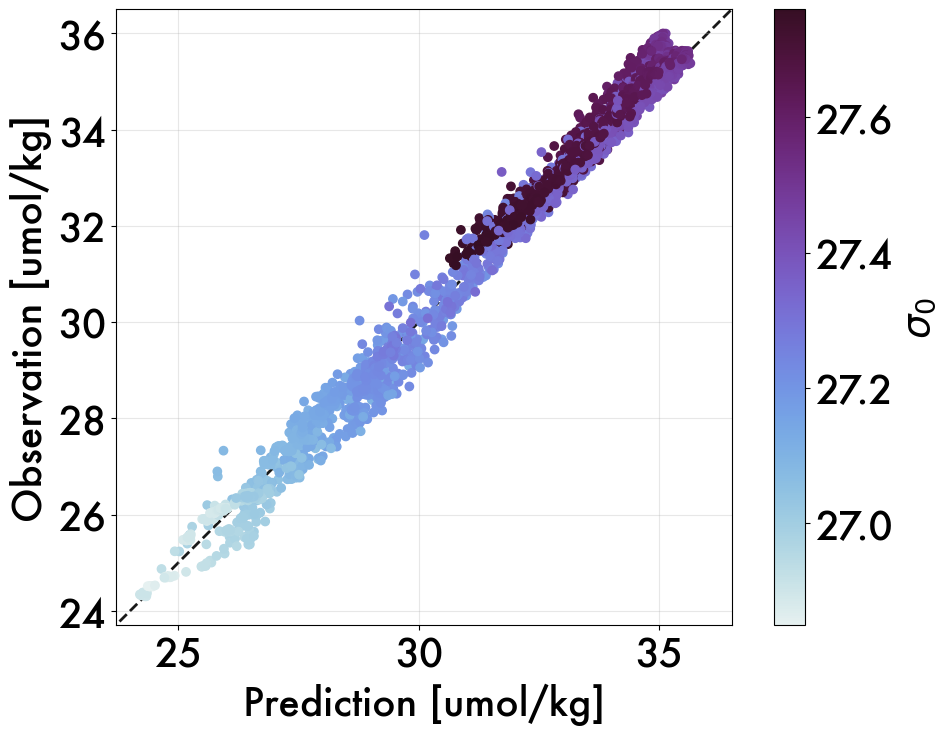

In [19]:
# Prediction Error as function of observed nitrate 1:1
# df = RF_ver[4]['Model_G']
df = RF_test['Model_G']
tag = 'Model G'


fig = plt.figure(figsize=(11,8))
ax = fig.gca()
plt.scatter(df.nitrate, df.test_prediction, c=df.sigma0, cmap=cmo.dense, zorder=3)
plt.plot([0, 40], [0, 40], 'k--', linewidth=2, alpha=0.9, zorder=0)
cbar = plt.colorbar().set_label(r'$\sigma_0$')
# cbar.set_label('Potential Density')
ax.set_aspect('equal')
ax.set_xlabel('Prediction [umol/kg]')
ax.set_ylabel('Observation [umol/kg]')
# ax.set_title('nitrate pred')
ax.set_ylim(23.7, 36.5)
ax.set_xlim(23.7, 36.5)
ax.grid(alpha=0.3, zorder=1)
ax.set_aspect('equal')


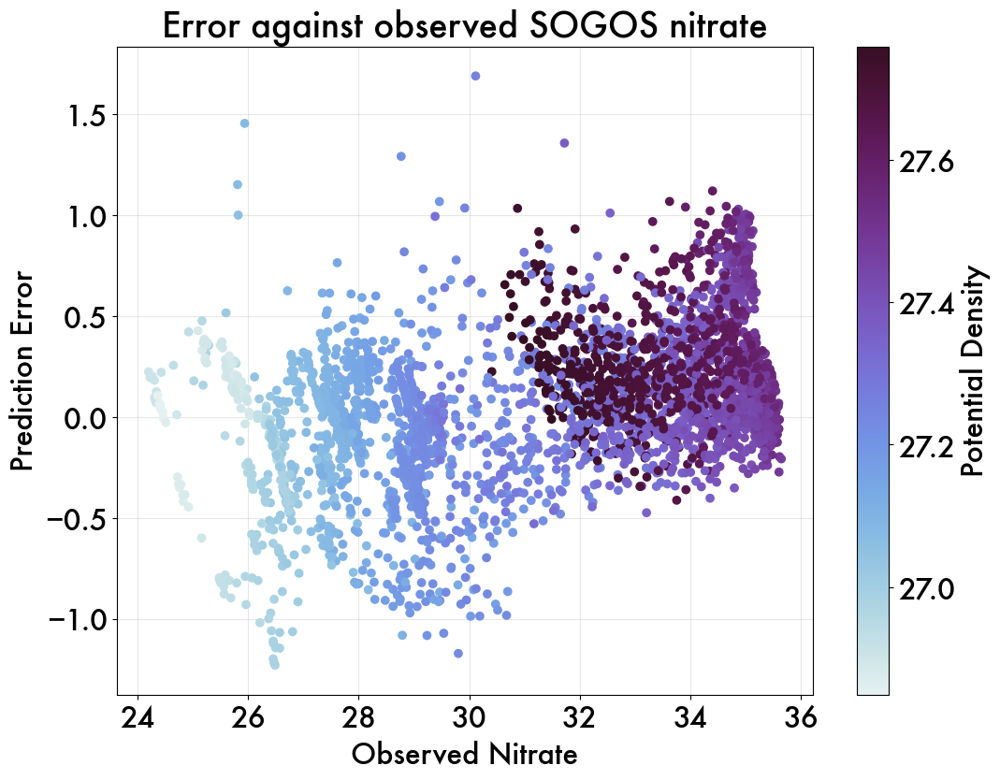

In [78]:
# Error against observed
fig = plt.figure(figsize=(12,9))
ax = fig.gca()
plt.scatter(df.nitrate, df.test_error, c=df.sigma0, cmap=cmo.dense, zorder=3)
cbar = plt.colorbar()
cbar.set_label('Potential Density')
ax.set_xlabel('Observed Nitrate')
ax.set_ylabel('Prediction Error')
ax.set_title('Error against observed SOGOS nitrate')
ax.grid(alpha=0.3, zorder=1)


# fig = plt.figure(figsize=(12,9))
# ax = fig.gca()
# plt.scatter(df.nitrate, df.test_error, c=df.CT, cmap=cmo.thermal, zorder=3)
# cbar = plt.colorbar()
# cbar.set_label('Conservative Temperature')
# ax.set_xlabel('Observed Nitrate')
# ax.set_ylabel('Prediction Error')
# ax.set_title('Error against observed SOGOS nitrate')
# ax.grid(alpha=0.3, zorder=1)


# fig = plt.figure(figsize=(12,9))
# ax = fig.gca()
# plt.scatter(df.nitrate, df.test_error, c=df.SA, cmap=cmo.haline, zorder=3)
# cbar = plt.colorbar()
# cbar.set_label('Absolute Salinity')
# ax.set_xlabel('Observed Nitrate')
# ax.set_ylabel('Prediction Error')
# ax.set_title('Error against observed SOGOS nitrate')
# ax.grid(alpha=0.3, zorder=1)


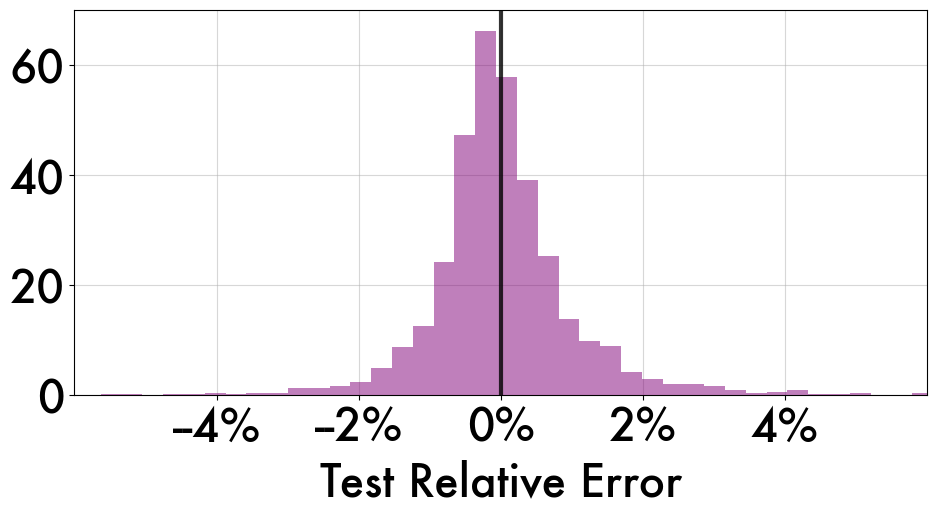

In [2142]:
# Plot histogram of test or validation errors (RELATIVE)
which = 'val'
save=False

if which == 'val':
    tag = 'Model Validation Errors'
    var = 'val_relative_error'; ymax=70
    # var = 'val_error'; ymax=2.3
    dat = RF_validation

else:
    tag = 'Model Test Errors'
    var = 'test_relative_error'; ymax=52
    # var = 'test_error'; ymax=2.3
    dat = RF_test
    

fig = plt.figure(figsize=(11,5))
# fig = plt.figure(figsize=(9, 5))
ax = fig.gca()

for mod in ['Model_G']: #model_list[:]:
    RF = dat[mod][var]
    ax.hist(RF, bins=40, alpha=0.5, color= model_palettes[mod], density=True, label=mod[-1], zorder=3)
    # hist, bin_edges = np.histogram(RF, bins=50); freq = hist/np.sum(hist)
    # plt.bar(bin_edges[:-1], freq, width = 0.08, color=model_palettes[mod],alpha=0.5, label=mod[-1:])

ax.vlines(0, ymin=0, ymax=ymax, colors='k', alpha=0.8, linewidth=3, zorder=3)
ax.set_ylim([0,ymax])


# plt.legend(fontsize=18)
# ax.set_xlabel('Relative Error %')
ax.set_xlabel('Test Relative Error')
ax.grid(alpha=0.5, zorder=1)

# For relative, uncomment following section
if which=='test':
    ax.set_xlim([-.09, 0.09])
if which == 'val':
    ticklist = [-0.04, -0.02, 0, 0.02, 0.04] 
    ax.set_xlim([-0.06, 0.06])
    ax.set_xticks(ticklist)
    ax.set_xticklabels(['--4%', '--2%', '0%', '2%', '4%'])


# For ABSOLUTE, uncomment following section
# ax.set_xlim([-2.1, 2.1])
# plt.title(tag)
ax.set_


# Show float uncertainty
ax.axvline(x=0.5, color='r', linestyle='--', linewidth=3, alpha=0.6, zorder=0)
ax.axvline(x=-0.5, color='r', linestyle='--', linewidth=3, alpha=0.6, zorder=0)

# if save:
    # plt.savefig('../figures/RF_' + which + '_error_distribution.png', dpi=300)

# RFR K-Fold Cross-Validation 

In [ ]:
rerun = False
desc='full'
if rerun:
    model_list = ['Model_A', 'Model_B', 'Model_C', 'Model_D', 'Model_E', 'Model_F', 'Model_G']

    # Initialize object again
    cv_kfold = rfr.CrossVal_KFold(model_list)

    for mdl in model_list: 
        df = pd.read_csv('../working-vars/RF-crossval/kfold_valDF_' + mdl + '_' + desc + '.csv')
        crossfold_MAEs = pd.read_csv('../working-vars/RF-crossval/kfold_list_MAEs_' + desc + '.csv')

        # Here's where we use the imported data 
        cv_kfold.val_DF[mdl] = df.copy()

        # Later, we will use the cv_kfold.val_error['Mdl_G'] to plot the histogram of full errors
        cv_kfold.val_error[mdl] = cv_kfold.val_DF[mdl]['val_error'] #allfold_val_df['val_error'] 
        cv_kfold.val_relative_error[mdl] = cv_kfold.val_DF[mdl]['val_relative_error']

        # We use the next imported data, MAE lists across models, 
        cv_kfold.MAEs[mdl] = crossfold_MAEs[mdl] # this is a list of 10 MAEs
                                                # mean of this is the final validation error for Model_X
        cv_kfold.IQRs[mdl] = crossfold_MAEs[mdl]


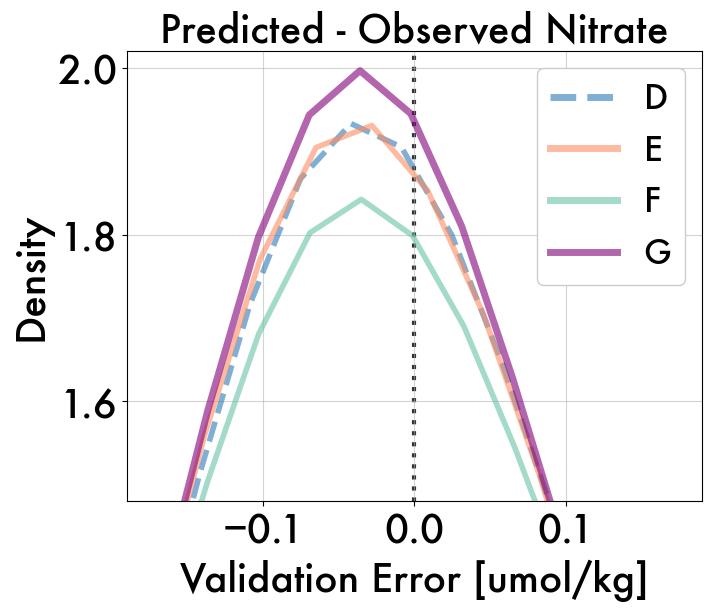

In [199]:
# KDE PROBABILITY DENSITY, VALIDATION ERRORS (ZOOM)
which = 'val'
save=False

if which == 'val':
    tag = 'Predicted - Observed Nitrate'
    # var = 'val_relative_error'; ymax=70
    var = 'val_error'; ymax=2.1
    dat = RF_validation

# fig = plt.figure(figsize=(10,4))
fig = plt.figure(figsize=(7,6), layout='constrained')
ax = fig.gca()

for mod in model_list[3:]: # ['Model_A', 'Model_G']: #
    RF = dat[mod][var]
    # shaded or step histogram
    # ax.hist(RF, bins=60, alpha=0.8, color= model_palettes[mod], density=True, label=mod[-1], zorder=3, histtype=u'step')

    # add gaussian/normed line
    # param = scipy.stats.gamma.fit(RF)
    # x = np.linspace(*RF.agg([min, max]), 100)
    # plt.plot(x, scipy.stats.gamma.pdf(x, *param), color=model_palettes[mod], linewidth=3, label=mod[-1])

    # add gaussian kde line
    x = np.linspace(*RF.agg([min, max]), 100)
    kde = scipy.stats.gaussian_kde(RF)

    lw = 4
    ls = 'solid'
    if mod == 'Model_G':
        lw=lw+1
    if mod in ['Model_D']:
        ls = '--'
    plt.plot(x, kde(x), color=model_palettes[mod], linewidth=lw, linestyle = ls, label=mod[-1], alpha=0.6)

# Show float uncertainty
ax.axvline(x=0.5, color='r', linestyle='--', linewidth=3, alpha=0.6, zorder=0)
ax.axvline(x=-0.5, color='r', linestyle='--', linewidth=3, alpha=0.6, zorder=0)
# Show 0
ax.vlines(0, ymin=0, ymax=ymax, colors='k', alpha=0.8, linewidth=3, linestyle='dotted', zorder=1)
ax.set_ylim([0,ymax])

ax.grid(alpha=0.55, zorder=1)

# SET LIMITS
# ax.set_xlim([-.48, 0.48])
# ax.set_ylim([0.5, 2.1])
ax.set_xlim([-.19, .19])
ax.set_ylim([1.48, 2.02])

plt.title(tag, fontsize=28)
ax.set_ylabel('Density')
ax.set_xlabel('Validation Error [umol/kg]')

#Legend
leg = plt.legend(fontsize=24, framealpha=1)
for legobj in leg.legendHandles:
    legobj.set_linewidth(5)


# if save:
    # plt.savefig('../figures/RF_' + which + '_error_distribution.png', dpi=300)

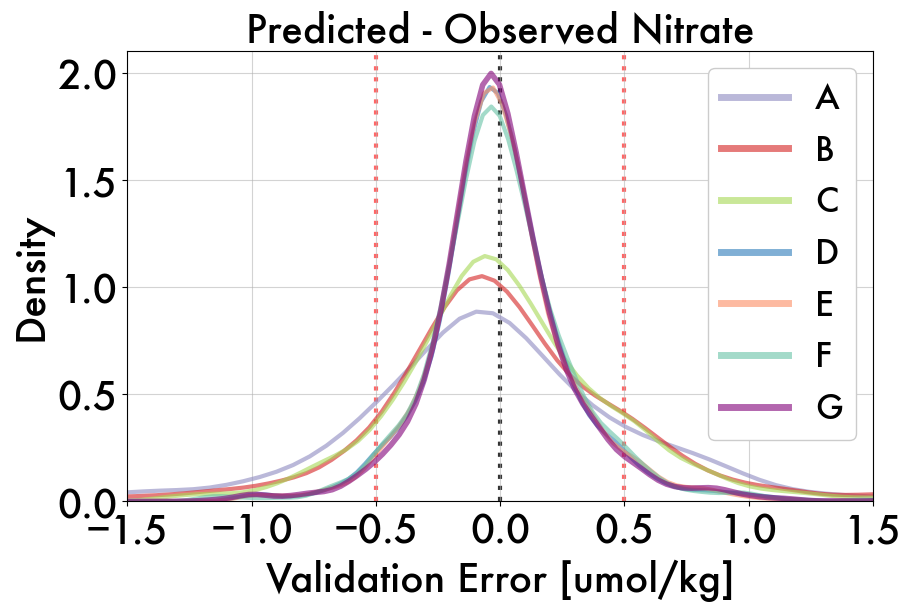

In [200]:
# KDE PROBABILITY DENSITY, VALIDATION ERRORS (FULL)
which = 'val'
save=False

if which == 'val':
    tag = 'Predicted - Observed Nitrate'
    # var = 'val_relative_error'; ymax=70
    var = 'val_error'; ymax=2.1
    dat = RF_validation

# fig = plt.figure(figsize=(10,4))
fig = plt.figure(figsize=(9,6), layout='constrained')
ax = fig.gca()

for mod in model_list[:]: # ['Model_A', 'Model_G']: #
    RF = dat[mod][var]
    # shaded or step histogram
    # ax.hist(RF, bins=60, alpha=0.8, color= model_palettes[mod], density=True, label=mod[-1], zorder=3, histtype=u'step')

    # add gaussian/normed line
    # param = scipy.stats.gamma.fit(RF)
    # x = np.linspace(*RF.agg([min, max]), 100)
    # plt.plot(x, scipy.stats.gamma.pdf(x, *param), color=model_palettes[mod], linewidth=3, label=mod[-1])

    # add gaussian kde line
    x = np.linspace(*RF.agg([min, max]), 100)
    kde = scipy.stats.gaussian_kde(RF)

    lw = 3
    ls = 'solid'
    if mod == 'Model_G':
        lw=lw+1
    # if mod in ['Model_A', 'Model_D']:
    #     ls = '--'
    plt.plot(x, kde(x), color=model_palettes[mod], linewidth=lw, linestyle=ls, label=mod[-1], alpha=0.6)

# Show float uncertainty
ax.axvline(x=0.5, color='r', linestyle='dotted', linewidth=3, alpha=0.6, zorder=0)
ax.axvline(x=-0.5, color='r', linestyle='dotted', linewidth=3, alpha=0.6, zorder=0)
# Show 0
ax.vlines(0, ymin=0, ymax=ymax, colors='k', alpha=0.8, linewidth=3, linestyle='dotted', zorder=1)
ax.set_ylim([0,ymax])

ax.grid(alpha=0.55, zorder=1)

# For ABSOLUTE, uncomment following section
ax.set_xlim([-1.5, 1.5])

plt.title(tag, fontsize=28)
ax.set_ylabel('Density')
ax.set_xlabel('Validation Error [umol/kg]')

#Legend
leg = plt.legend(fontsize=24, framealpha=1)
for legobj in leg.legendHandles:
    legobj.set_linewidth(5)


# if save:
    # plt.savefig('../figures/RF_' + which + '_error_distribution.png', dpi=300)

In [2385]:
# COMBINED: GOOD PAPER FIG
KDE PROBABILITY DENSITY, VALIDATION ERRORS (FULL)

tag = 'Predicted - Observed Nitrate'
# var = 'val_relative_error'; ymax=70
var = 'val_error'; ymax=2.1
dat = RF_all.val_err

# Make Figure with 2 Subplots
fig, axs = plt.subplots(1, 2, figsize=(12,5), layout='constrained')
axs=axs.flatten()

for ax in axs[0:1]:
    for mod in model_list[:]: 
        RF = dat[mod][var]

        # Add Gaussian KDE to estimate probability density function
        x = np.linspace(*RF.agg([min, max]), 100)
        kde = scipy.stats.gaussian_kde(RF)

        lw = 3; ls = 'solid'
        if mod == 'Model_G':
            lw=lw+1
        ax.plot(x, kde(x), color=model_palettes[mod], linewidth=lw, linestyle=ls, label=mod[-1], alpha=0.6)

    if var == 'val_error':
        ax.set_xlim([-1.5, 1.5])

    leg = ax.legend(fontsize=16, framealpha=1)
    for legobj in leg.legendHandles:
        legobj.set_linewidth(5)

for ax in axs[1:]:
    for mod in model_list[3:]: # ['Model_A', 'Model_G']: #
        RF = dat[mod][var]

        # Gaussian KDE
        x = np.linspace(*RF.agg([min, max]), 100)
        kde = scipy.stats.gaussian_kde(RF)

        lw = 4; ls = 'solid'
        if mod == 'Model_G':
            lw=lw+1
        if mod in ['Model_D']:
            ls = '--'
        plt.plot(x, kde(x), color=model_palettes[mod], linewidth=lw, linestyle = ls, label=mod[-1], alpha=0.6)

    ax.set_xlim([-.19, .19])
    ax.set_ylim([1.48, 2.02])

    # Legend
    leg = plt.legend(fontsize=16, framealpha=1)
    for legobj in leg.legendHandles:
        legobj.set_linewidth(5)
    
for ax in axs:
    # Show float uncertainty and 0 line
    ax.axvline(x=0.5, color='r', linestyle='dotted', linewidth=3, alpha=0.6, zorder=0)
    ax.axvline(x=-0.5, color='r', linestyle='dotted', linewidth=3, alpha=0.6, zorder=0)
    ax.vlines(0, ymin=0, ymax=ymax, colors='k', alpha=0.8, linewidth=3, linestyle='dotted', zorder=1)
    ax.set_ylim([0,ymax])
    ax.grid(alpha=0.55, zorder=1)

    ax.set_ylabel('Density')
    ax.set_xlabel('Validation Error [umol/kg]')
    ax.set_title(tag, fontsize=16)


7

In [328]:
umol_unit = (r'$\mathbf{[\mu} \mathregular{mol~kg} \mathbf{^{-1}]}$')

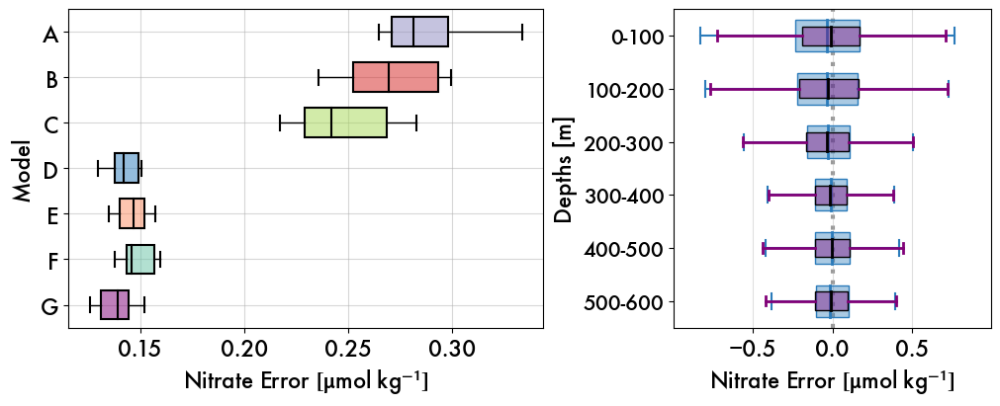

In [344]:
# Plot boxplot of MAE distributions, 
# And check error bias by depth for two models D and G

reload(sgplot)

# Plot boxplots for 10 MAEs per model
pressure_ranges = [(0, 100), (100, 200), (200, 300), (300, 400), (400, 500),
                    (500, 600) ] #(600, 700), (700, 800), (800, 900), (900, 1000)]
mod_one = 'Model_D'
mod_two = 'Model_G'
bias_one = rfr.get_depth_bias(cv_kfold.val_DF[mod_one], pressure_ranges)
bias_two = rfr.get_depth_bias(cv_kfold.val_DF[mod_two], pressure_ranges)


sgplot.kfold_boxplots(cv_kfold.MAEs, bias_one, bias_two, modlist = [mod_one, mod_two],
                      figsize = (9,4));


In [10]:
list = []
for model in model_list:
    print(model + ', CV bias median')
    print(np.nanmedian(cv_kfold.val_error[model]))
    list.append(np.nanmedian(cv_kfold.val_error[model]))


Model_A, CV bias median
-0.05315743639896195
Model_B, CV bias median
-0.0351399792075106
Model_C, CV bias median
-0.03888027618165775
Model_D, CV bias median
-0.019010739826125403
Model_E, CV bias median
-0.0173160972645227
Model_F, CV bias median
-0.02012378432509895
Model_G, CV bias median
-0.0151962289400273


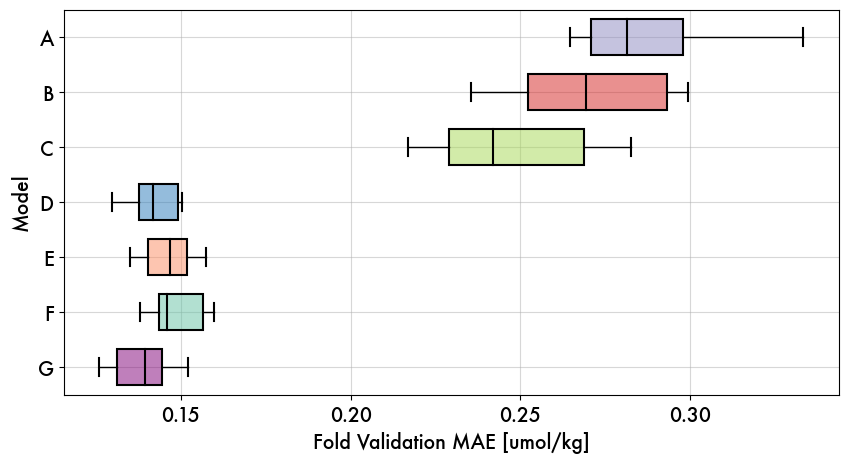

In [12]:
# Plot boxplots for 10 MAEs per model

data = cv_kfold.MAEs  
# kfold_MAEs_bymodel = pd.DataFrame.from_dict(cv_kfold.MAEs)
fig, ax = plt.subplots(figsize=(10,5))

lw= 1.5
bplot = ax.boxplot(data.values(), widths=0.65, vert=False, patch_artist=True,
                   medianprops = {'color':'k', 'linewidth':lw},
                   capprops= {'color':'k', 'linewidth':lw},
                   flierprops= {'color':'k', 'linewidth':lw},
                   boxprops = {'color':'k', 'linewidth':lw})
ax.set_yticklabels([x[-1] for x in data.keys()])
ax.grid(zorder=1, alpha=0.5)
ax.invert_yaxis()
ax.set_ylabel('Model')
ax.set_xlabel('Fold Validation MAE [umol/kg]')

colors = []
for mdl in model_list:
    colors.append(model_palettes[mdl])

for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(matplotlib.colors.to_rgba(color, alpha=0.5))

plt.show()

# RFR LOO Cross-Validation

In [345]:
cvloo_metrics= pd.read_csv('../working-vars/RF-crossval/loo_metrics_' + desc + '.csv')

# RFR Testing Errors

In [2397]:
size = 36 # 22
plt.style.use('default')
params = {'legend.fontsize': size-4, 
          'xtick.labelsize':size, 
          'ytick.labelsize':size, 
          'font.size':size,
          'font.family':'Futura'}
plt.rcParams.update(params)

Text(0.5, 1.0, 'Predicted - Observed Nitrate')

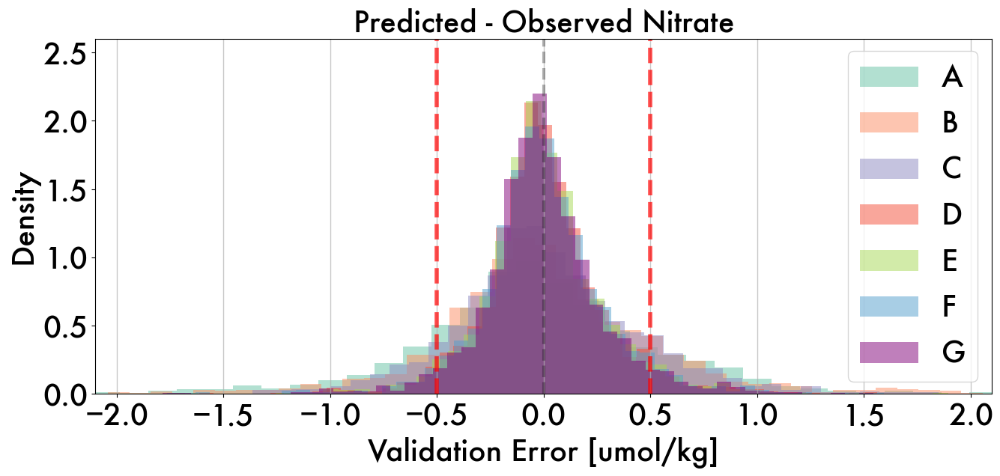

In [20]:
# For paper: put all models in model_list...
# For presentation: stacking val error histograms successively

dat = RF_validation
tag = 'Model Validation Errors'
save = False
vartag = 'val_error'

# dat = RF_ver[4]
# tag = 'Model Test Errors'
# save = True
# vartag = 'test_error'

# for i in range(len(model_list)):
i=6
fig = plt.figure(figsize=(14,7), layout='tight')
ax = fig.gca()

for mod in model_list[:i+1]:
    # RF = list(dat[mod]['test_relative_error'])
    RF = dat[mod][vartag]
    ax.hist(RF, bins=50, alpha=0.5, color= model_palettes[mod], label=mod[-1:], density=True)
    # hist, bin_edges = np.histogram(RF, bins=50); freq = hist/np.sum(hist)
    # plt.bar(bin_edges[:-1], freq, width = 0.08, color=model_palettes[mod],alpha=0.5, label=mod[-1:])


histmax = 2.6
ax.vlines(0, ymin=0, ymax=histmax, colors='k', alpha=0.3, linestyles='dashed', linewidth=3)
ax.vlines(0.5, ymin=0, ymax=histmax, colors='r', alpha=0.7, linewidth=4, linestyles='dashed')
ax.vlines(-0.5, ymin=0, ymax=histmax, colors='r', alpha=0.7, linewidth=4, linestyles='dashed')

if vartag == 'test_error':
    ax.set_ylim([0,1.5])
if vartag == 'val_error':
    ax.set_ylim([0,histmax])
    ax.set_xlim([-2.1, 2.1])
plt.legend(fontsize=28, loc='right')

# ax.set_xlabel('Relative Error %')
ax.set_xlabel('Validation Error [umol/kg]')
ax.grid(axis='x', alpha=0.7, linewidth=1)
ax.set_ylabel('Density')
ax.set_title('Predicted - Observed Nitrate', fontsize=28)
# plt.title(tag)

    # if save:
    #     plt.savefig('../figures/RFvalidation_' + vartag + '_' + str(i) + '.png', dpi=300, bbox_inches='tight')
    #     plt.close()

Text(0.5, 1.0, 'Nitrate distributions')

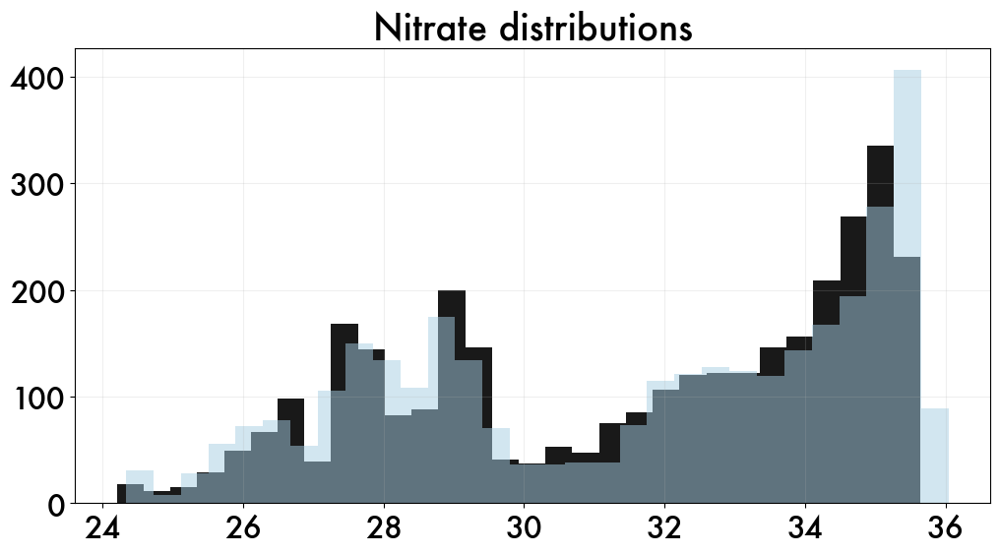

In [1004]:
# Plot nitrate distributions
tag = 'Nitrate distributions'
dat = RF_test

fig = plt.figure(figsize=(12,6))
ax = fig.gca()

obs_nitrate = dat['Model_G']['nitrate']
ax.grid(zorder=0, alpha=0.2)
plt.hist(obs_nitrate, bins=30, alpha=0.9, label='sogos', color='k', zorder=1)
plt.hist(dat['Model_G'].test_prediction, bins=30, alpha=0.5) #, bins=30, alpha=0.5, label='Model_G', color=model_palettes[mod], zorder=3)


# for mod in model_list[-1]:
#     RF = np.array(dat[mod]['test_prediction'])
#     plt.hist(RF, bins=30, alpha=0.5, label=mod, color=model_palettes[mod], zorder=3)
    
# plt.legend()
ax.set_title(tag)

In [1313]:
RF_validation['Model_G']

,Unnamed: 0,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,...,o2sat,mncos,mnsin,month,nitrate,wmoid,profid,dist_maxb,val_error,val_relative_error
0,0,-593.547292,-52.8920,31.7120,6.960000,2.085854,34.037968,325.23074,27.067434,-16.838210,...,332.790348,-0.866025,0.500000,5,27.181572,5904469.0,5904469086,144.670000,-0.211958,-0.007798
1,1,-593.547292,-52.8920,31.7120,11.679999,2.083042,34.037929,325.17587,27.067623,-16.838210,...,332.813789,-0.866025,0.500000,5,27.086271,5904469.0,5904469086,139.950001,-0.117131,-0.004324
2,2,-593.547292,-52.8920,31.7120,16.930000,2.082774,34.037896,325.16750,27.067618,-14.246867,...,332.816008,-0.866025,0.500000,5,27.265087,5904469.0,5904469086,134.700000,-0.296488,-0.010874
3,3,-593.547292,-52.8920,31.7120,21.920000,2.081123,34.038553,325.06177,27.068270,-16.170565,...,332.827969,-0.866025,0.500000,5,27.045603,5904469.0,5904469086,129.710000,-0.079161,-0.002927
4,4,-593.547292,-52.8920,31.7120,31.990000,2.080541,34.037803,324.85498,27.067719,-13.660800,...,332.834622,-0.866025,0.500000,5,27.314634,5904469.0,5904469086,119.640000,-0.354609,-0.012982
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2928,2928,119.690972,-51.5000,30.0017,750.300000,2.381413,34.724253,177.70000,27.589555,-12.326162,...,328.588815,-0.500000,0.866025,4,34.380000,NaN,41,-575.900000,-0.130336,-0.003791
2929,2929,120.004167,-51.0076,29.9980,47.400000,4.794754,33.942179,309.20000,26.734963,-12.321180,...,311.733002,-0.866025,0.500000,5,21.780000,NaN,42,95.800000,0.639559,0.029364
2930,2930,120.000000,-51.0072,29.9982,343.500000,2.978545,34.341953,236.10000,27.233849,-11.703082,...,324.731603,-0.500000,0.866025,4,31.260000,NaN,42,-200.300000,1.111423,0.035554
2931,2931,119.996528,-51.0066,29.9984,677.200000,2.565968,34.599175,182.60000,27.474441,-11.987382,...,327.404242,-0.500000,0.866025,4,34.740000,NaN,42,-534.000000,-0.262411,-0.007554


In [2227]:
print_error_depths(RF_test['Model_G'], var='test_error', pres_lim = [0,1000], yd_lim=[120,200])

Errors between depths 0 to 1000:
Yeardays: 120 to 200:
median abs error: 	0.3832035518333185
mean abs error 		0.42608298331110617

95% of errors fall between:
-0.79322 to 1.14042

During SOGOS between depths 0 to 1000:
95% of errors fall between:
-0.79322 to 1.14042


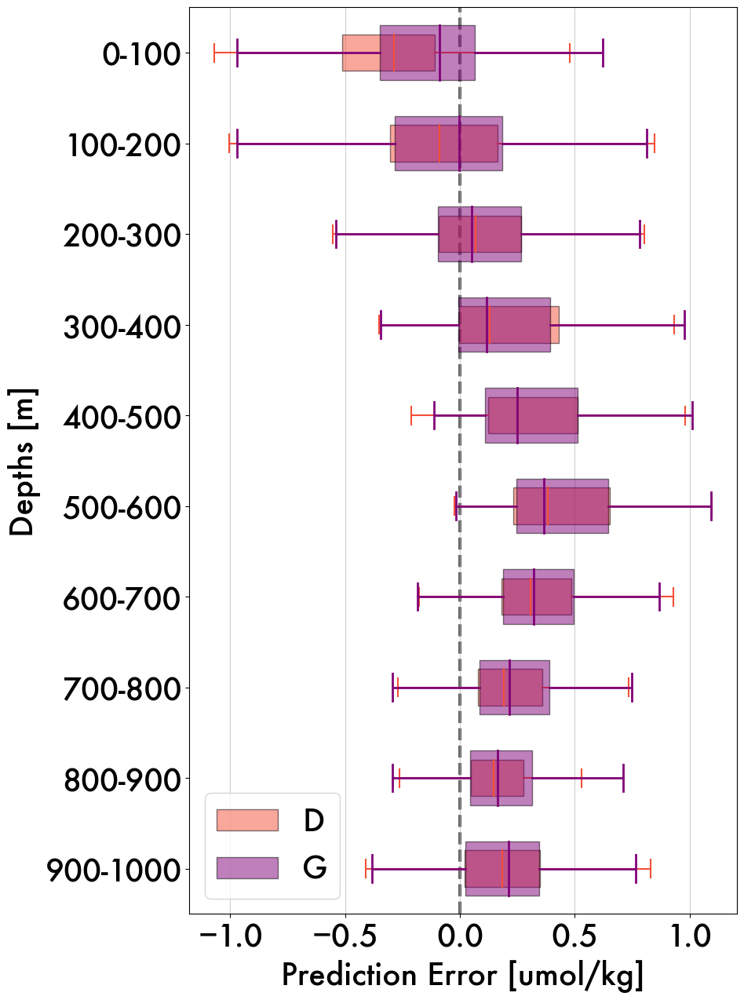

In [413]:
# TEST ERRORS BY DEPTH

mod_one = 'Model_D'
mod_two = 'Model_G'

dat_one = RF_test[mod_one]
testerr_one = {
    "0-100": dat_one[(dat_one["pressure"] >= 0) & (dat_one["pressure"] < 100)]["test_error"].values,
    "100-200": dat_one[(dat_one["pressure"] >= 100) & (dat_one["pressure"] < 200)]["test_error"].values,
    "200-300": dat_one[(dat_one["pressure"] >= 200) & (dat_one["pressure"] < 300)]["test_error"].values,
    "300-400": dat_one[(dat_one["pressure"] >= 300) & (dat_one["pressure"] < 400)]["test_error"].values,
    "400-500": dat_one[(dat_one["pressure"] >= 400) & (dat_one["pressure"] < 500)]["test_error"].values,
    "500-600": dat_one[(dat_one["pressure"] >= 500) & (dat_one["pressure"] < 600)]["test_error"].values,
    "600-700": dat_one[(dat_one["pressure"] >= 600) & (dat_one["pressure"] < 700)]["test_error"].values,
    "700-800": dat_one[(dat_one["pressure"] >= 700) & (dat_one["pressure"] < 800)]["test_error"].values,
    "800-900": dat_one[(dat_one["pressure"] >= 800) & (dat_one["pressure"] < 900)]["test_error"].values,
    "900-1000": dat_one[(dat_one["pressure"] >= 900) & (dat_one["pressure"] < 1000)]["test_error"].values
}

dat_two = RF_test[mod_two]
testerr_two = {
    "0-100": dat_two[(dat_two["pressure"] >= 0) & (dat_two["pressure"] < 100)]["test_error"].values,
    "100-200": dat_two[(dat_two["pressure"] >= 100) & (dat_two["pressure"] < 200)]["test_error"].values,
    "200-300": dat_two[(dat_two["pressure"] >= 200) & (dat_two["pressure"] < 300)]["test_error"].values,
    "300-400": dat_two[(dat_two["pressure"] >= 300) & (dat_two["pressure"] < 400)]["test_error"].values,
    "400-500": dat_two[(dat_two["pressure"] >= 400) & (dat_two["pressure"] < 500)]["test_error"].values,
    "500-600": dat_two[(dat_two["pressure"] >= 500) & (dat_two["pressure"] < 600)]["test_error"].values,
    "600-700": dat_two[(dat_two["pressure"] >= 600) & (dat_two["pressure"] < 700)]["test_error"].values,
    "700-800": dat_two[(dat_two["pressure"] >= 700) & (dat_two["pressure"] < 800)]["test_error"].values,
    "800-900": dat_two[(dat_two["pressure"] >= 800) & (dat_two["pressure"] < 900)]["test_error"].values,
    "900-1000": dat_two[(dat_two["pressure"] >= 900) & (dat_two["pressure"] < 1000)]["test_error"].values
}

color_one = model_palettes['Model_D'] # sns.color_palette("Purples")[3]
color_two = model_palettes['Model_G']

# col_one = {'color':color_one, 'linewidth':1}
col_one = {'color':color_one, 'linewidth':1.5}
col_two = {'color':color_two, 'linewidth':2}

# fig = plt.figure(figsize=(9,13))
fig = plt.figure(figsize=(9,15)) # 10,13 
ax = fig.gca()


bplot_one = ax.boxplot(testerr_one.values(), vert=False, showfliers=False, widths=0.4, 
                    patch_artist=True, boxprops={'facecolor':color_one, 'alpha':0.5},
                    medianprops=col_one,
                    capprops=col_one,
                    whiskerprops=col_one,
                    flierprops=col_one)

bplot_two = ax.boxplot(testerr_two.values(), vert=False, showfliers=False, widths=0.6, 
                    patch_artist=True, boxprops={'facecolor':model_palettes[mod_two], 'alpha':0.5, 'edgecolor':'k'},
                    medianprops= col_two,
                    capprops=col_two,
                    whiskerprops=col_two,
                    flierprops=col_two)

ax.invert_yaxis()
ax.axvline(x=0, color='k', linestyle='--', linewidth=3, alpha=0.6, zorder=0)

labels = testerr_one.keys()
plt.yticks(range(1, len(labels) + 1), labels)
plt.ylabel("Depths [m]", fontsize=28)
plt.xlabel("Prediction Error [umol/kg]", fontsize=28)
# plt.title("SOGOS Test Error")
ax.grid(axis='x', alpha=0.6)
ax.legend([bplot_one["boxes"][0], bplot_two["boxes"][0]], [mod_one[-1], mod_two[-1]], loc='lower left', fontsize=28)

# plt.savefig('../figures/ModelDvsG_test_error_bydepth.png', dpi=300, bbox_inches='tight')

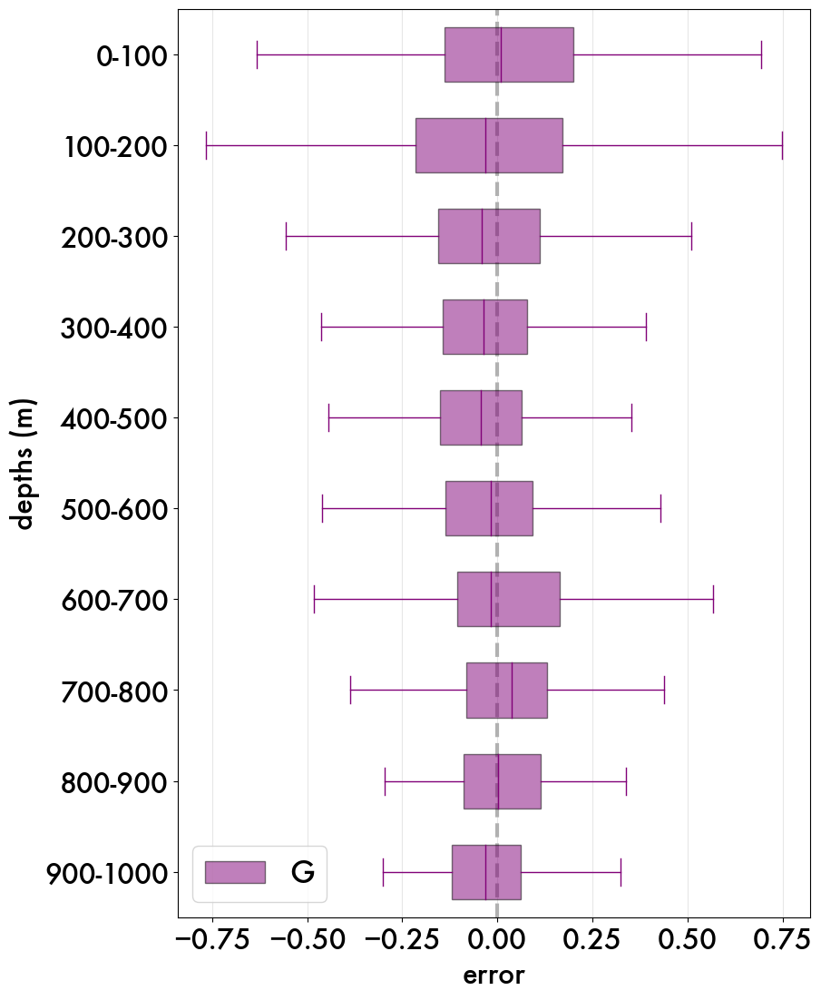

In [111]:
# VALIDATION BY DEPTH VERISON: Compare two models VALIDATION

mod_one = 'Model_D'
mod_two = 'Model_G'

dat_one = RF_validation[mod_one]
valerr_one = {
    "0-100": dat_one[(dat_one["pressure"] >= 0) & (dat_one["pressure"] < 100)]["val_error"].values,
    "100-200": dat_one[(dat_one["pressure"] >= 100) & (dat_one["pressure"] < 200)]["val_error"].values,
    "200-300": dat_one[(dat_one["pressure"] >= 200) & (dat_one["pressure"] < 300)]["val_error"].values,
    "300-400": dat_one[(dat_one["pressure"] >= 300) & (dat_one["pressure"] < 400)]["val_error"].values,
    "400-500": dat_one[(dat_one["pressure"] >= 400) & (dat_one["pressure"] < 500)]["val_error"].values,
    "500-600": dat_one[(dat_one["pressure"] >= 500) & (dat_one["pressure"] < 600)]["val_error"].values,
    "600-700": dat_one[(dat_one["pressure"] >= 600) & (dat_one["pressure"] < 700)]["val_error"].values,
    "700-800": dat_one[(dat_one["pressure"] >= 700) & (dat_one["pressure"] < 800)]["val_error"].values,
    "800-900": dat_one[(dat_one["pressure"] >= 800) & (dat_one["pressure"] < 900)]["val_error"].values,
    "900-1000": dat_one[(dat_one["pressure"] >= 900) & (dat_one["pressure"] < 1000)]["val_error"].values
}

dat_two = RF_validation[mod_two]
valerr_two = {
    "0-100": dat_two[(dat_two["pressure"] >= 0) & (dat_two["pressure"] < 100)]["val_error"].values,
    "100-200": dat_two[(dat_two["pressure"] >= 100) & (dat_two["pressure"] < 200)]["val_error"].values,
    "200-300": dat_two[(dat_two["pressure"] >= 200) & (dat_two["pressure"] < 300)]["val_error"].values,
    "300-400": dat_two[(dat_two["pressure"] >= 300) & (dat_two["pressure"] < 400)]["val_error"].values,
    "400-500": dat_two[(dat_two["pressure"] >= 400) & (dat_two["pressure"] < 500)]["val_error"].values,
    "500-600": dat_two[(dat_two["pressure"] >= 500) & (dat_two["pressure"] < 600)]["val_error"].values,
    "600-700": dat_two[(dat_two["pressure"] >= 600) & (dat_two["pressure"] < 700)]["val_error"].values,
    "700-800": dat_two[(dat_two["pressure"] >= 700) & (dat_two["pressure"] < 800)]["val_error"].values,
    "800-900": dat_two[(dat_two["pressure"] >= 800) & (dat_two["pressure"] < 900)]["val_error"].values,
    "900-1000": dat_two[(dat_two["pressure"] >= 900) & (dat_two["pressure"] < 1000)]["val_error"].values
}

color_one = model_palettes['Model_D'] # sns.color_palette("Purples")[3]
color_two = model_palettes['Model_G']

# col_one = {'color':color_one, 'linewidth':1}
col_one = {'color':color_one, 'linewidth':1}
col_two = {'color':color_two, 'linewidth':1}

fig = plt.figure(figsize=(9,13))
# fig = plt.figure(figsize=(13,13))
ax = fig.gca()


# bplot_one = ax.boxplot(valerr_one.values(), vert=False, showfliers=False, widths=0.4, 
#                     patch_artist=True, boxprops={'facecolor':color_one, 'alpha':0.6},
#                     medianprops=col_one,
#                     capprops=col_one,
#                     whiskerprops=col_one,
#                     flierprops=col_one)

bplot_two = ax.boxplot(valerr_two.values(), vert=False, showfliers=False, widths=0.6, 
                    patch_artist=True, boxprops={'facecolor':model_palettes[mod_two], 'alpha':0.5, 'edgecolor':'k'},
                    medianprops= col_two,
                    capprops=col_two,
                    whiskerprops=col_two,
                    flierprops=col_two)



ax.invert_yaxis()
ax.axvline(x=0, color='k', linestyle='--', linewidth=3, alpha=0.3, zorder=0)

labels = valerr_one.keys()
plt.yticks(range(1, len(labels) + 1), labels)
plt.ylabel("depths (m)")
plt.xlabel("error")
# plt.title("SOGOS val Error")

# ax.legend([bplot_one["boxes"][0], bplot_two["boxes"][0]], [mod_one[-1], mod_two[-1]], loc='lower left', fontsize=24)
ax.grid(axis='x', alpha=0.3)

# ax.legend([bplot_two["boxes"][0]], [mod_two[-1]], loc='lower left', fontsize=24)
# plt.savefig('../figures/ModelDvsG_val_error_bydepth.png', dpi=300, bbox_inches='tight')

# Glider Prediction Sections

(950.0, 0.0)

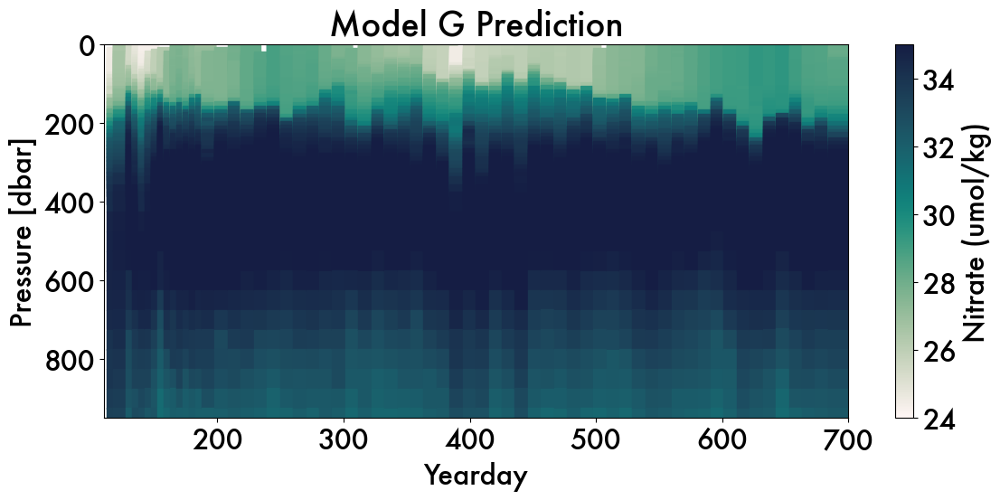

In [1314]:
# SOGOS Float Model G Prediction Profile Map

dat = RF_test['Model_G']
# tag = 'SOGOS Observation'
tag = 'Model G Prediction'


fig  = plt.figure(figsize=(12,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.test_prediction, cmap=cmo.tempo, s=250, marker='s', vmin=24, vmax=35)
# sca = ax.scatter(dat.yearday, dat.pressure, c=dat.nitrate, cmap=cmo.tempo, s=250, marker='s', vmin=24, vmax=35)

ax.set_title(tag) # + ' Error (Pred - Obs), Fixed Standard')
plt.colorbar(sca, ax=ax).set_label('Nitrate (umol/kg)')

ax.invert_yaxis()
ax.set_ylabel('Pressure [dbar]')
ax.set_xlabel('Yearday')

ax.set_xlim([110,700])
ax.set_ylim([950,0])

# plt.savefig('../figures/ModelG_observation_profmap.png', dpi=300, bbox_inches='tight')

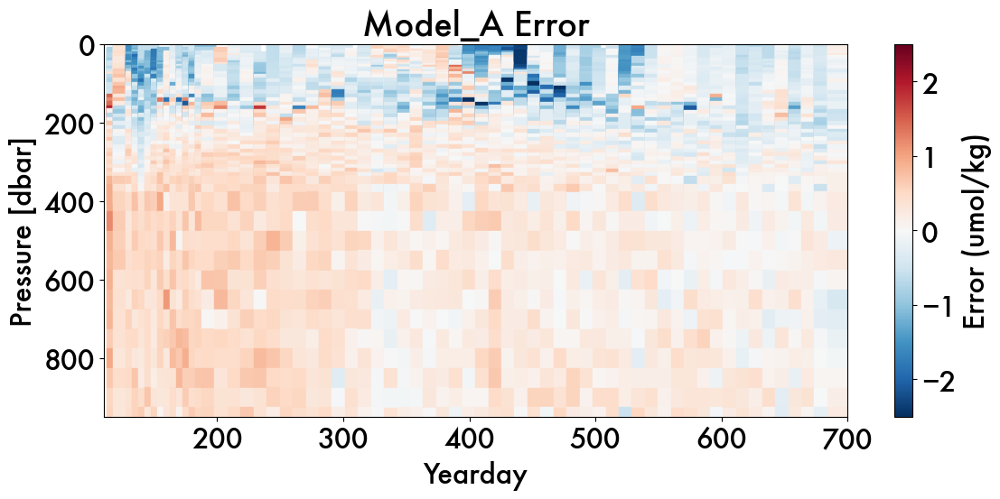

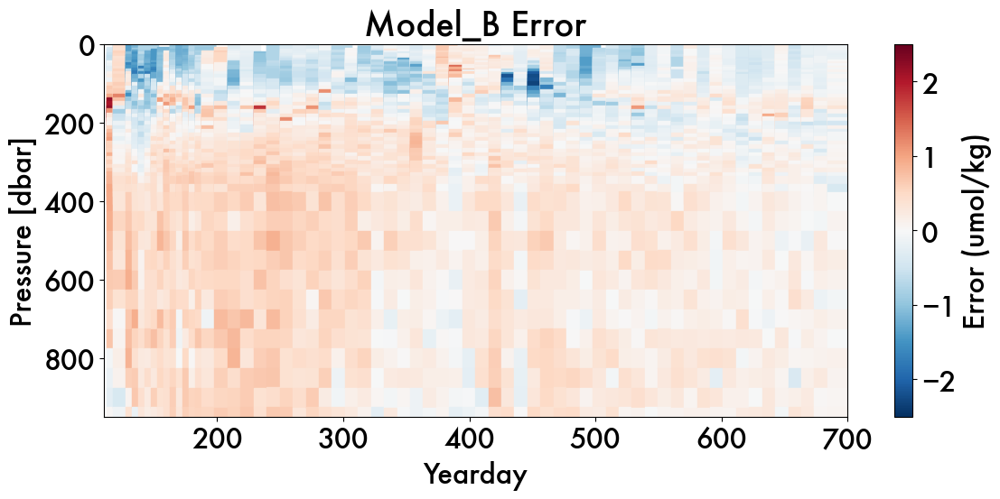

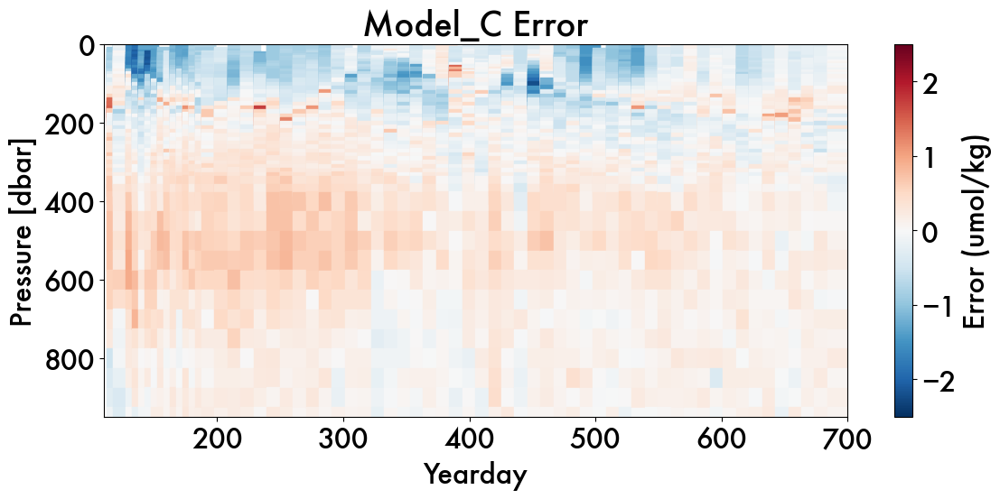

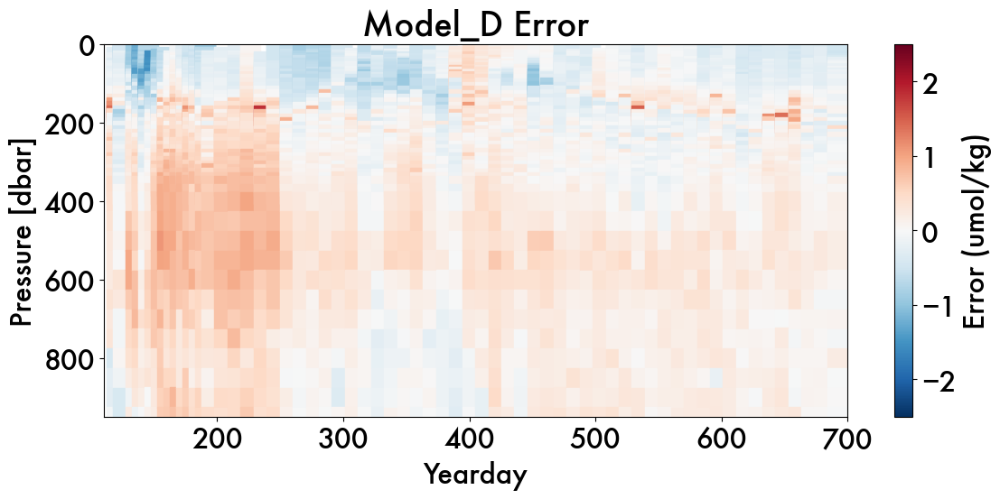

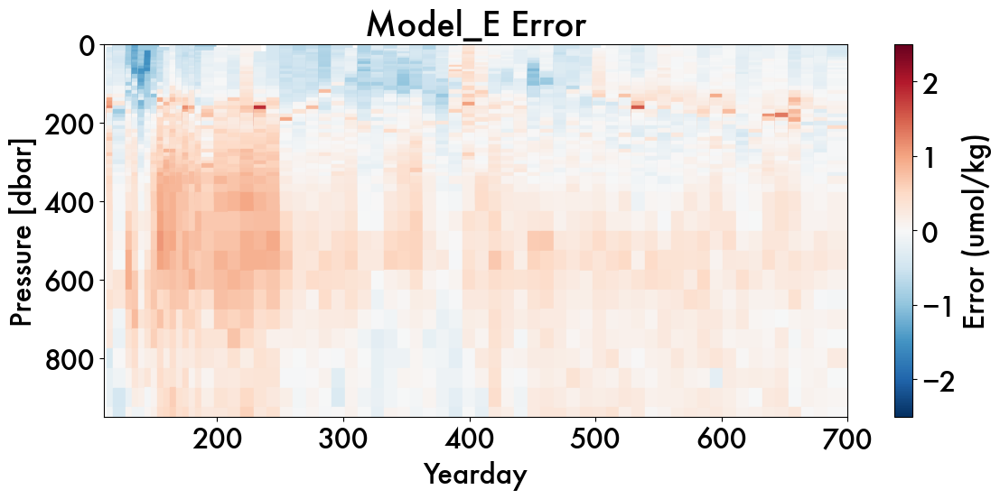

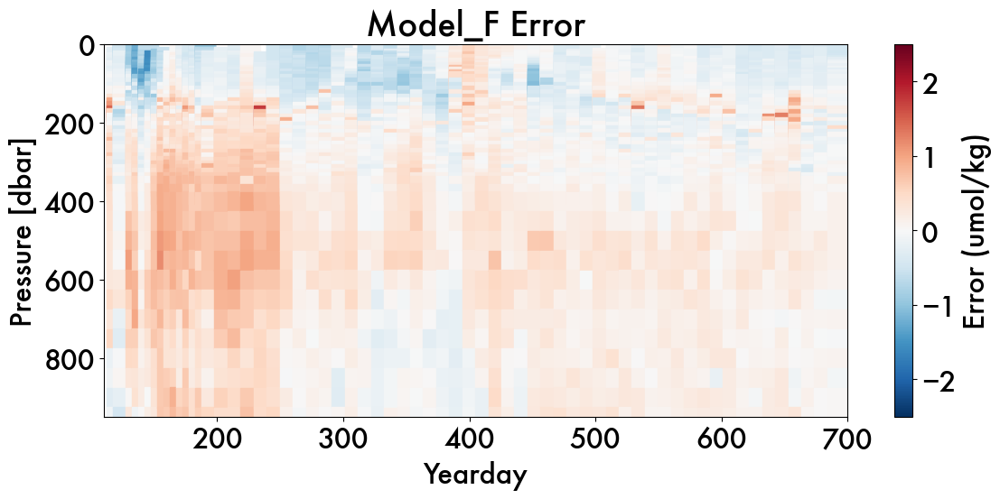

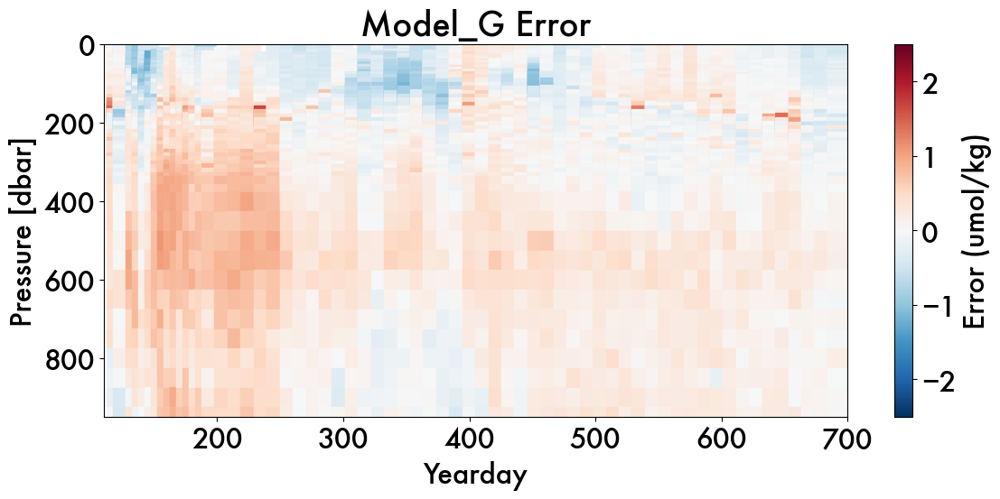

In [576]:
# SINGLE TEST ERROR PROFILE
for modtag in model_list:
    dat = RF_test[modtag]
    # dat = olddat
    tag = modtag + ' Error'


    fig  = plt.figure(figsize=(12,6), tight_layout=True)
    ax = plt.gca()
    sca = ax.scatter(dat.yearday, dat.pressure, c=dat.test_error, cmap='RdBu_r', s=250, marker='s' , vmin=-2.5, vmax=2.5)
    ax.set_title(tag) # + ' Error (Pred - Obs), Fixed Standard')

    plt.colorbar(sca, ax=ax).set_label('Error (umol/kg)')

    ax.invert_yaxis()
    ax.set_ylabel('Pressure [dbar]')
    ax.set_xlabel('Yearday')

    ax.set_xlim([110,700])
    ax.set_ylim([950,0])
    plt.show()

# plt.savefig('../figures/ModelG_error_profmap.png', dpi=300, bbox_inches='tight')

(110.0, 700.0)

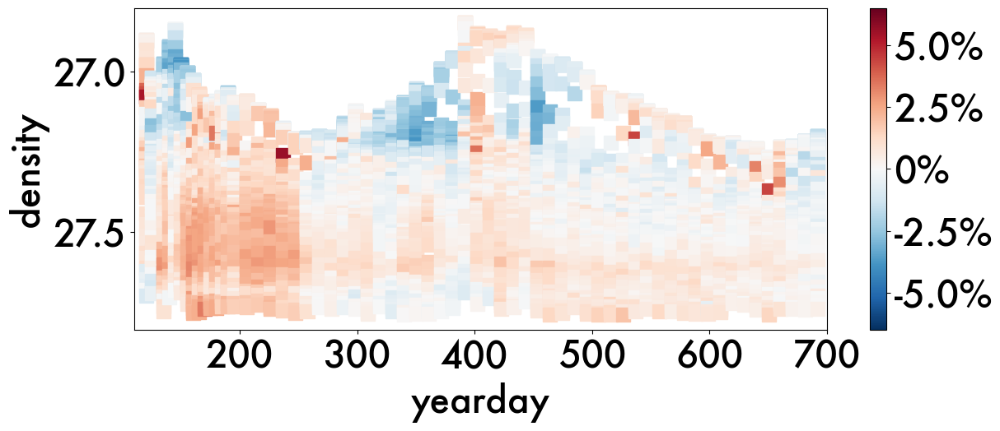

In [11]:
# DENSITY SPACE:  TEST RELATIVE ERROR PROFILE

dat = RF_test['Model_G']
tag = 'Model G'
# dat = RF_18_05t
# tag = 'RF_ver18, Mdl 05t'

fig  = plt.figure(figsize=(13,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.sigma0, c=dat.test_relative_error, cmap='RdBu_r', s=150, marker='s', vmin=-.065, vmax=.065) #vmin=-0.065, vmax=0.065) #, vmin=-2.5, vmax=2.5) # , , vmin = 24, vmax=35.0
# ax.set_title(tag + ' Relative Error')


# ticklist = [-0.04, -0.02, 0, 0.02, 0.04] 
ticklist = [-0.05, -0.025, 0, 0.025, 0.05]
cbar = plt.colorbar(sca, ax=ax, ticks=ticklist) # [-0.28, -0.025, 0, 0.025, 0.28]
cbar.ax.set_yticklabels(['-5.0%', '-2.5%', '0%', '2.5%', '5.0%'])  # Setting tick labels here
# cbar.set_label('Relative Error') 

ax.invert_yaxis()
ax.set_ylabel('density')
ax.set_xlabel('yearday')
# ax.set_xlim([1y0, 550])
# ax.set_ylim([600,0])

ax.set_xlim([110,700])
# ax.set_ylim([950,0])

# plt.savefig('../figures/ModelG_relerror_profmap.png', dpi=300, bbox_inches='tight')

(950.0, 0.0)

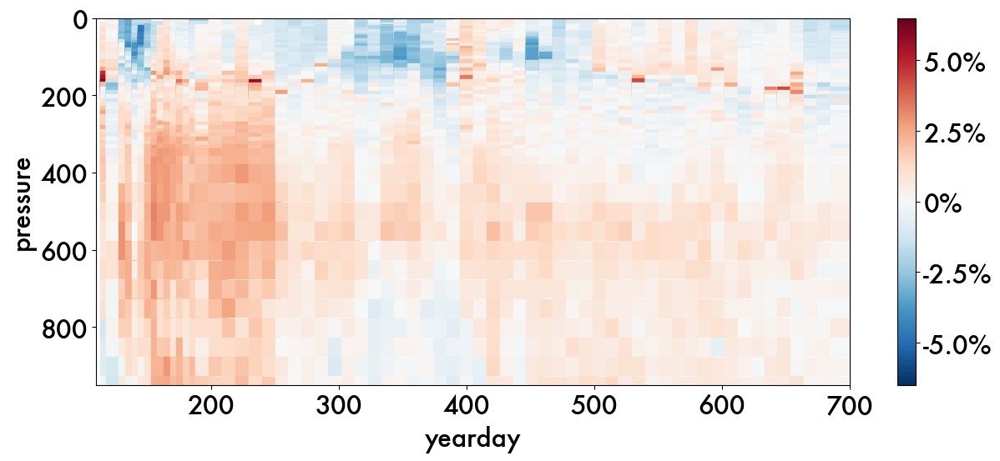

In [1240]:
# SINGLE TEST RELATIVE ERROR PROFILE
# dat = RF_verE[4]['Mdl_13t']
# tag = 'RF_verE, model 13t'

dat = RF_test['Model_G']
tag = 'Model G'
# dat = RF_18_05t
# tag = 'RF_ver18, Mdl 05t'

fig  = plt.figure(figsize=(13,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.test_relative_error, cmap='RdBu_r', s=250, marker='s', vmin=-.065, vmax=.065) #vmin=-0.065, vmax=0.065) #, vmin=-2.5, vmax=2.5) # , , vmin = 24, vmax=35.0
# ax.set_title(tag + ' Relative Error')


# ticklist = [-0.04, -0.02, 0, 0.02, 0.04] 
ticklist = [-0.05, -0.025, 0, 0.025, 0.05]
cbar = plt.colorbar(sca, ax=ax, ticks=ticklist) # [-0.28, -0.025, 0, 0.025, 0.28]
cbar.ax.set_yticklabels(['-5.0%', '-2.5%', '0%', '2.5%', '5.0%'])  # Setting tick labels here
# cbar.set_label('Relative Error') 

ax.invert_yaxis()
ax.set_ylabel('pressure')
ax.set_xlabel('yearday')
# ax.set_xlim([1y0, 550])
# ax.set_ylim([600,0])

ax.set_xlim([110,700])
ax.set_ylim([950,0])

# plt.savefig('../figures/ModelG_relerror_profmap.png', dpi=300, bbox_inches='tight')

In [394]:
print_error_depths(RF_test['Model_G'])

Errors between depths 0 to 1000:
Yeardays: 0 to 10000:
median abs error: 	0.20436577591667765
mean abs error 		0.2705284930384429

95% of errors fall between:
-0.62246 to 0.77856

During SOGOS between depths 0 to 1000:
95% of errors fall between:
-0.68752 to 1.07966


Text(0.5, 0, 'Days since Jan 01 2019')

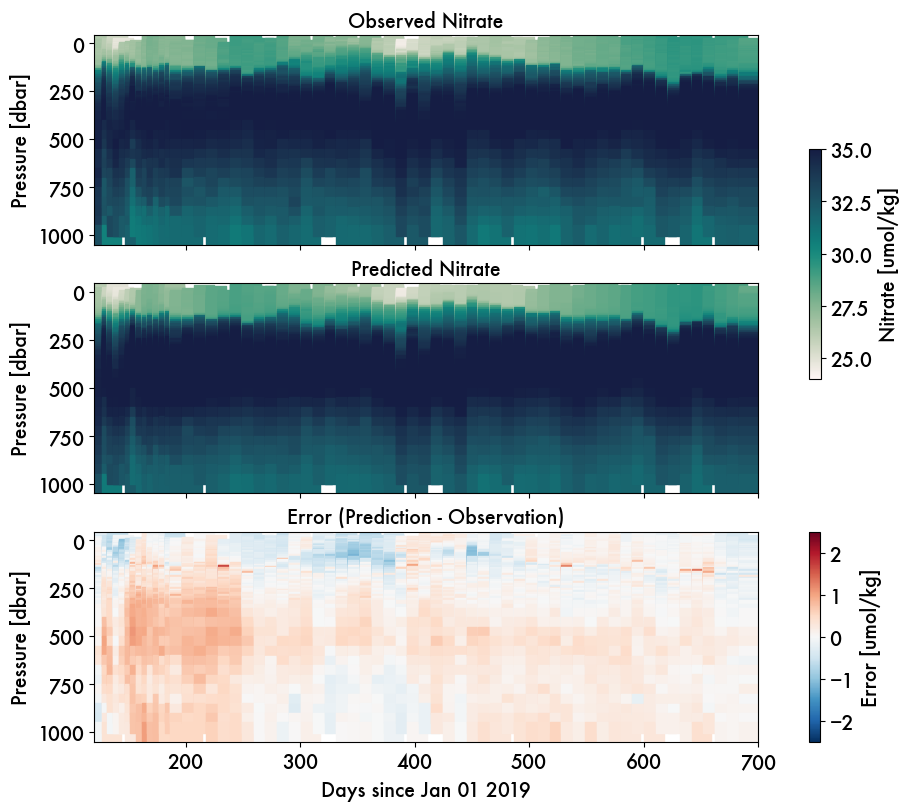

In [29]:
# * (Absolute, 3 subplots) Prediction, Obs, and Error Profiles
dat = RF_test['Model_G']
tag = 'Model G'

fig, axs = plt.subplots(3,1, figsize=(9,8), layout='constrained', sharex=True)
axs = axs.flatten()

sca0 = axs[0].scatter(dat.yearday, dat.pressure, c=dat.nitrate, cmap=cmo.tempo, s=200, marker='s', vmin=24, vmax=35) #, vmin=0, vmax=0.005
axs[0].set_title('Observed Nitrate', fontsize=14)

sca1 = axs[1].scatter(dat.yearday, dat.pressure, c=dat.test_prediction, cmap=cmo.tempo, s=200, marker='s', vmin=24, vmax=35) #, vmin=0, vmax=0.005
axs[1].set_title('Predicted Nitrate', fontsize=14) 

sca2 = axs[2].scatter(dat.yearday, dat.pressure, c=dat.test_error, cmap='RdBu_r', s=200, marker='s', vmin=-2.5, vmax=2.5)
axs[2].set_title('Error (Prediction - Observation)', fontsize=14)


fig.colorbar(sca0, ax=axs[0:2], shrink=0.5).set_label('Nitrate [umol/kg]')
# fig.colorbar(sca1, ax=axs[1]).set_label('Nitrate (umol/kg)')
fig.colorbar(sca2, ax=axs[2]).set_label('Error [umol/kg]')

for ax in axs:
    ax.invert_yaxis()
    ax.set_ylabel('Pressure [dbar]')
    ax.set_xlim([120,700])

axs[2].set_xlabel('Days since Jan 01 2019')

# plt.savefig('../figures/ModelG_combined_3_profmap.png', dpi=300, bbox_inches='tight')

# Comparison to ESPER/CANYON

In [ ]:
from mod_RFR import RF_pred_6030, ESPER_pred, CANYON_pred

(950.0, 0.0)

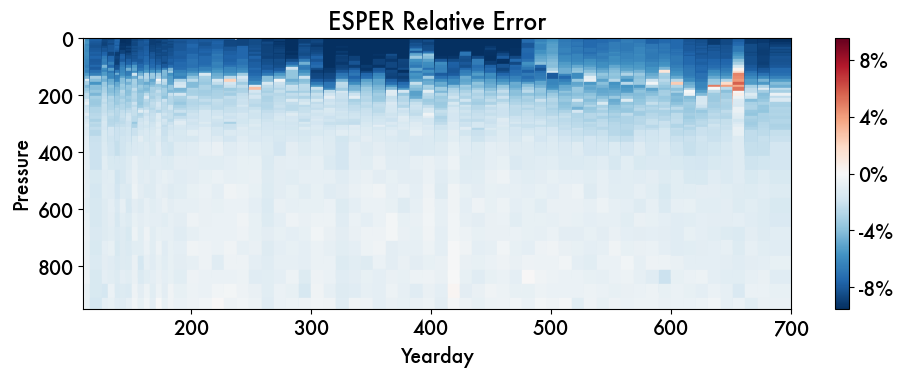

In [ ]:
# Plotting ESPER Relative Error profile maps
dat = ESPER_pred

fig  = plt.figure(figsize=(10,4), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.rel_pred_error, cmap='RdBu_r', s=250, marker='s', vmin=-.095, vmax=.095) #vmin=-0.090, vmax=0.090) #, vmin=-2.5, vmax=2.5) # , , vmin = 24, vmax=35.0

ax.set_title('ESPER Relative Error')


ticklist = [-0.08, -0.04, 0, 0.04, 0.08] 
# ticklist = [-0.05, -0.025, 0, 0.025, 0.05]
cbar = plt.colorbar(sca, ax=ax, ticks=ticklist) # [-0.28, -0.025, 0, 0.025, 0.28]
# cbar.ax.set_yticklabels(['-5.0%', '-2.5%', '0%', '2.5%', '5.0%'])  # Setting tick labels here
cbar.ax.set_yticklabels(['-8%', '-4%', '0%', '4%', '8%']) 


# cbar.set_label('Relative Error') 

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
# ax.set_xlim([120, 550])
# ax.set_ylim([600,0])

ax.set_xlim([110,700])
ax.set_ylim([950,0])

(950.0, 0.0)

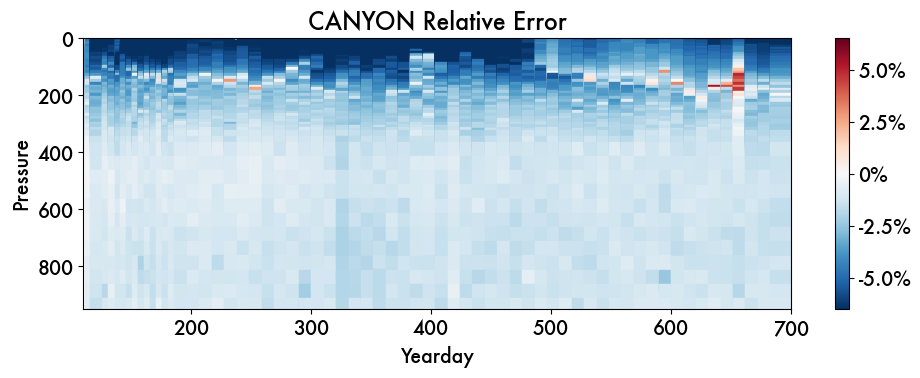

In [ ]:
# Plotting CANYON Relative Error profile maps
dat = CANYON_pred

fig  = plt.figure(figsize=(10,4), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.rel_pred_error, cmap='RdBu_r', s=250, marker='s', vmin=-.065, vmax=.065) #vmin=-0.065, vmax=0.065) #, vmin=-2.5, vmax=2.5) # , , vmin = 24, vmax=35.0

ax.set_title('CANYON Relative Error')

# ticklist = [-0.04, -0.02, 0, 0.02, 0.04] 
ticklist = [-0.05, -0.025, 0, 0.025, 0.05]
cbar = plt.colorbar(sca, ax=ax, ticks=ticklist) # [-0.28, -0.025, 0, 0.025, 0.28]
cbar.ax.set_yticklabels(['-5.0%', '-2.5%', '0%', '2.5%', '5.0%'])  # Setting tick labels here
# cbar.set_label('Relative Error') 

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
# ax.set_xlim([120, 550])
# ax.set_ylim([600,0])

ax.set_xlim([110,700])
ax.set_ylim([950,0])

Text(0.5, 0, 'Yearday')

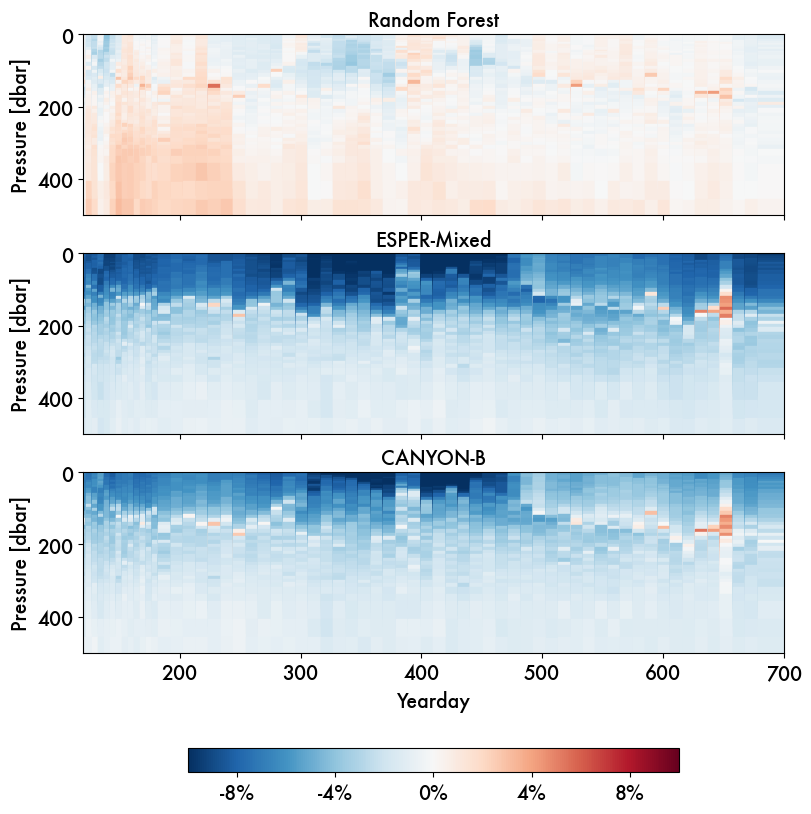

In [ ]:
# * (Relative, 3 subplots) Prediction, Obs, and Error Profiles
# RELATIVE 
dat = RF_test['Model_G']

fig, axs = plt.subplots(3,1, figsize=(8,8), layout='constrained', sharex=True) # 12, 14
axs = axs.flatten()

sca0 = axs[0].scatter(dat.yearday, dat.pressure, c=dat.test_relative_error, cmap='RdBu_r', s=530, marker='s', vmin=-.10, vmax=.10) #, vmin=0, vmax=0.005
axs[0].set_title('Random Forest', fontsize=14)

sca1 = axs[1].scatter(ESPER_pred.yearday, ESPER_pred.pressure, c=ESPER_pred.rel_pred_error, cmap='RdBu_r', s=530, marker='s',vmin=-.10, vmax=.10) #, vmin=0, vmax=0.005
axs[1].set_title('ESPER-Mixed', fontsize=14) 

sca2 = axs[2].scatter(CANYON_pred.yearday, CANYON_pred.pressure, c=CANYON_pred.rel_pred_error, cmap='RdBu_r', s=530, marker='s', vmin=-.10, vmax=.10)
axs[2].set_title('CANYON-B', fontsize=14)

# vertical colorbar
# ticklist = [-0.08, -0.04, 0, 0.04, 0.08] 
# cbar = fig.colorbar(sca1, ax=axs[:], ticks=ticklist, shrink=0.5, orientation='vertical').ax.set_yticklabels(['-8%', '-4%', '0%', '4%', '8%']) 

# or horizontal:
ticklist = [-0.08, -0.04, 0, 0.04, 0.08] 
cbar = fig.colorbar(sca1, ax=axs[:], ticks=ticklist, shrink=0.7, orientation='horizontal').ax.set_xticklabels(['-8%', '-4%', '0%', '4%', '8%'], fontsize=14) 


for ax in axs:
    ax.invert_yaxis()
    ax.set_ylabel('Pressure [dbar]')
    ax.set_xlim([120,700])
    ax.set_ylim([500,0])

# axs[1].set_xlabel('Days since Jan 01 2019')
axs[2].set_xlabel('Yearday')

# plt.savefig('../figures/canyon_esper_rel_error_400m.png', bbox_inches='tight')

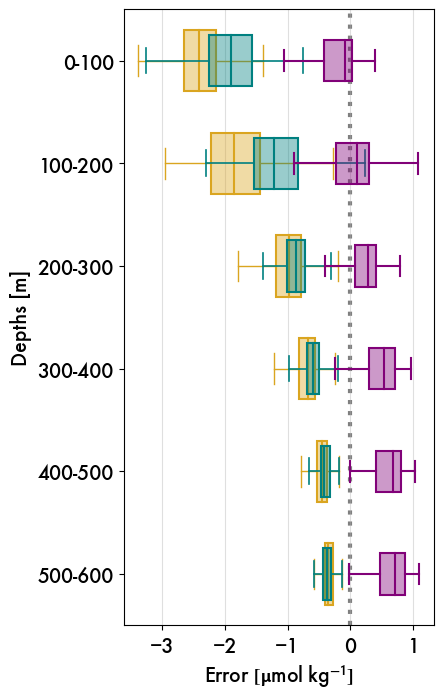

In [ ]:
# Plot bias by depths, for CANYON/ESPER 
mod_one = 'RFR'
mod_two = 'CANYON-B'
mod_three = 'ESPER-Mixed'
color_one = model_palettes['Model_G'] # sns.color_palette("Purples")[3]
color_two =  'teal' #model_palettes['Model_D']
color_three = 'goldenrod'# model_palettes['Model_E']


# Get bias data over depth for CANYON, ESPER
pressure_ranges = [(0, 100), (100, 200), (200, 300), (300, 400), (400, 500),
                    (500, 600) ] #(600, 700), (700, 800), (800, 900), (900, 1000)]
bias_float = rfr.get_depth_bias(RF_pred_6030, pressure_ranges, var='test_error')
bias_canyon = rfr.get_depth_bias(CANYON_pred, pressure_ranges, var='prediction_error')
bias_esper = rfr.get_depth_bias(ESPER_pred, pressure_ranges, var='prediction_error')


# col_one = {'color':color_one, 'linewidth':1}
col_one = {'color':color_one, 'linewidth':1}
col_two = {'color':color_two, 'linewidth':1}
col_three = {'color':color_three, 'linewidth':1}

fig = plt.figure(figsize=(4,8))
# fig = plt.figure(figsize=(13,13))
ax = fig.gca()

# ESPER 
lw = 1
bplot_three = ax.boxplot(bias_esper.values(), vert=False, showfliers=False, widths=0.6, 
                    patch_artist=True, 
                    medianprops= {'color':color_three, 'linewidth':1.5},
                    capprops={'color':color_three, 'linewidth':lw},
                    whiskerprops={'color':color_three, 'linewidth':lw},
                    flierprops={'color':color_three, 'linewidth':lw},
                    boxprops = {'color':color_three, 'linewidth':1.5},
                    zorder=3)
for patch, color in zip(bplot_three['boxes'], [color_three]*10):
    patch.set_facecolor(mpcolors.to_rgba(color, alpha=0.4))

# CANYON
lw = 1.2
bplot_two = ax.boxplot(bias_canyon.values(), vert=False, showfliers=False, widths=0.5, 
                    patch_artist=True, 
                    medianprops= {'color':color_two, 'linewidth':1.5},
                    capprops={'color':color_two, 'linewidth':lw },
                    whiskerprops={'color':color_two, 'linewidth':lw },
                    flierprops={'color':color_two, 'linewidth':lw},
                    boxprops = {'color':color_two, 'linewidth':1.5},
                    zorder=4)
for patch, color in zip(bplot_two['boxes'], [color_two]*10):
    patch.set_facecolor(mpcolors.to_rgba(color, alpha=0.4))

# RFR
lw = 1.5
bplot_one = ax.boxplot(bias_float.values(), vert=False, showfliers=False, widths=0.4, 
                    patch_artist=True, 
                    medianprops= {'color':color_one, 'linewidth':lw},
                    capprops={'color':color_one, 'linewidth':lw },
                    whiskerprops={'color':color_one, 'linewidth':lw },
                    flierprops={'color':color_one, 'linewidth':lw },
                    boxprops = {'color':color_one, 'linewidth':1.5},
                    zorder=5)
for patch, color in zip(bplot_one['boxes'], [color_one]*10):
    patch.set_facecolor(mpcolors.to_rgba(color, alpha=0.4))

ax.invert_yaxis()
ax.axvline(x=0, color='k', linestyle='dotted', linewidth=3, alpha=0.5, zorder=0)

labels = bias_float.keys()
plt.yticks(range(1, len(labels) + 1), labels)
plt.ylabel("Depths [m]")
plt.xlabel("Error " + umol_unit)
# plt.title("Test Errors", fontsize=16)

# ax.legend([bplot_one["boxes"][0], bplot_two["boxes"][0], bplot_three["boxes"][0]], 
#           [mod_one, mod_two, mod_three], loc='lower left', fontsize=12)
ax.grid(axis='x', zorder=1, alpha=0.4)
# plt.savefig('../figures/canyon_esper_comparison_bydepth.png', dpi=300, bbox_inches='tight')

# Outdated: Cross-Validation

Text(0.5, 0, 'Error [umol/kg]')

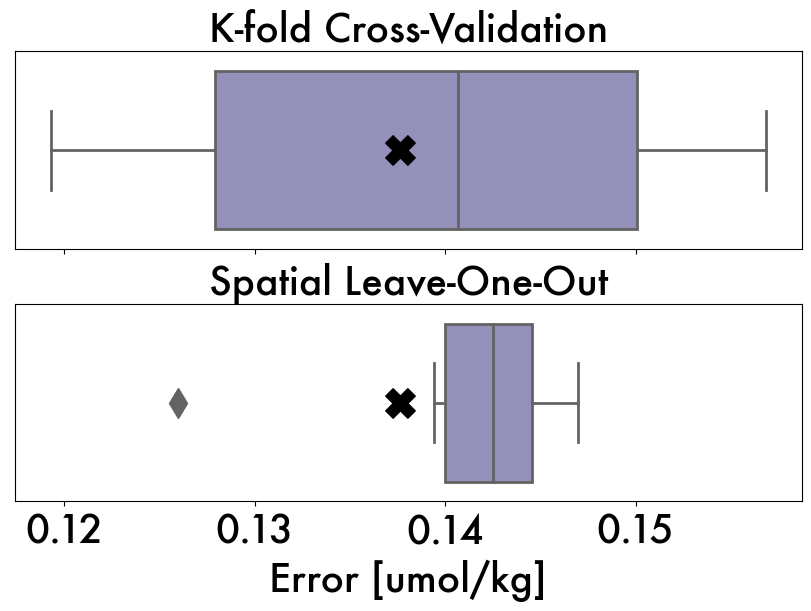

In [171]:
# PAPER FIG: CROSS VAL
fig, axs = plt.subplots(2,1,figsize=(8,6), layout='constrained', sharex=True)
axs = axs.flatten()

sns.boxplot(RF_kfold['fvalidation_MAE'].values, ax=axs[0],color=model_palettes['Model_C'], linewidth=2, orient='h')
axs[0].scatter([0.137654], [0], marker='X', s=450, c='k')
# axs[0].set_title('Validation MAE')
axs[0].set_yticks([])


sns.boxplot(RF_loo['validation_MAE'].values,  ax=axs[1], color=model_palettes['Model_C'], linewidth=2, orient='h', fliersize=15)
axs[1].scatter([0.137654], [0], marker='X', s=450, c='k')
axs[1].set_yticks([])

axs[0].set_title('K-fold Cross-Validation', fontsize=28)
axs[1].set_title('Spatial Leave-One-Out', fontsize=28)
axs[1].set_xlabel('Error [umol/kg]', fontsize=28)

# sns.boxplot(RF_kfold['ftest_MAE'].values,  ax=axs[1], color=model_palettes['Model_G'], linewidth=2)
# axs[1].scatter([0], [0.208741], marker='X', s=250, c='k')
# # axs[1].set_title('Test MAE')

In [586]:
RF_kfold
print(np.mean(RF_kfold['fvalidation_MAE']))
print(np.std(RF_kfold['fvalidation_MAE']))

0.13819926157082238
0.012038106673769564


In [587]:
RF_loo
print(np.mean(RF_loo['validation_MAE']))
print(np.std(RF_loo['validation_MAE']))

0.1405361840625092
0.006490142316300936


Text(0.5, 1.0, 'Test MAE')

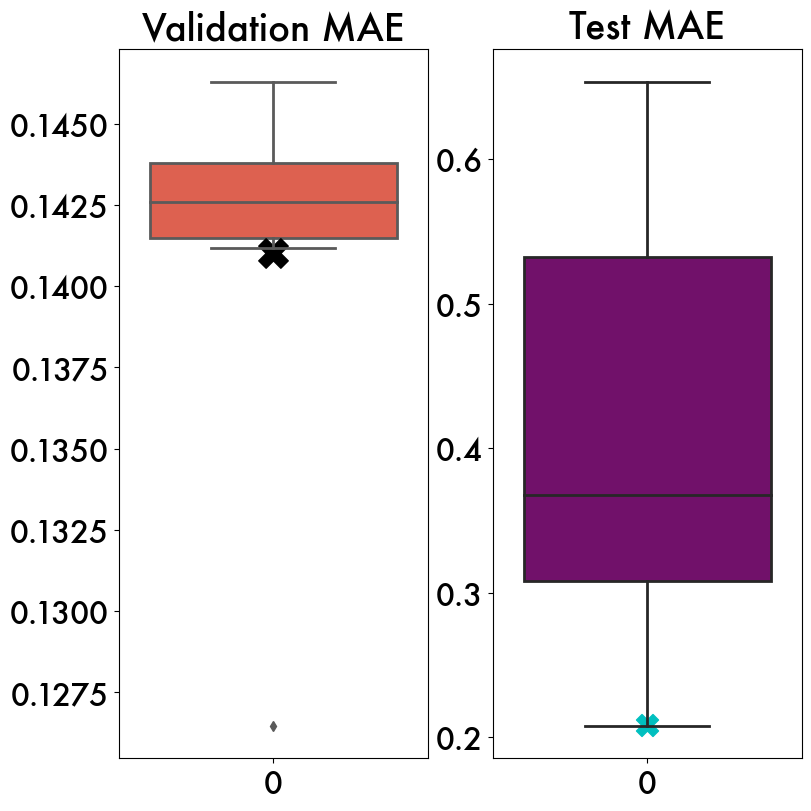

In [50]:

fig, axs = plt.subplots(1,2,figsize=(8,8), layout='constrained')
axs = axs.flatten()

sns.boxplot(RF_loo['validation_MAE'].values, ax=axs[0],color=model_palettes['Model_D'], linewidth=2)
axs[0].scatter([0], [0.141022], marker='X', s=450, c='k')
axs[0].set_title('Validation MAE')


sns.boxplot(RF_loo['test_MAE'].values,  ax=axs[1], color=model_palettes['Model_G'], linewidth=2)
axs[1].scatter([0], [0.208741], marker='X', s=250, c='c')
axs[1].set_title('Test MAE')

In [581]:
print('ESPER') 
print_error_depths(ESPER_pred, var='prediction_error', pres_lim = [0,400])

ESPER
Errors between depths 0 to 400:
Yeardays: 0 to 10000:
median abs error: 	1.4276796589700993
mean abs error 		1.547960096389261

95% of errors fall between:
-3.13864 to 0.06712

During SOGOS between depths 0 to 400:
95% of errors fall between:
-2.83217 to -0.10703


# Glider Sections

In [2251]:
dat = RF_test['Model_G']
dat = dat[dat['pressure'] < 200]
dat = dat[(dat.yearday<205) & (dat.yearday>170)]
dat.test_error.median()

-0.0050072589166418

In [2253]:
print_error_depths(RF_test['Model_G'], var='test_error', pres_lim = [0,200], yd_lim=[170,205])

Errors between depths 0 to 200:
Yeardays: 170 to 205:
median abs error: 	0.19328000424993336
mean abs error 		0.23331458592350826

95% of errors fall between:
-0.54935 to 0.64516

During SOGOS between depths 0 to 200:
95% of errors fall between:
-0.54935 to 0.64516


In [19]:
sgfloat = RF_pred_6030.copy()
# Get daily float locations for the argo float 
sgfloat['rounded_yearday'] = np.floor(sgfloat['yearday'])

# Group by the rounded 'yearday' and calculate the averages of 'latitude' and 'longitude'
grouped = sgfloat.groupby('rounded_yearday').agg({'lat': 'mean', 'lon': 'mean'}).reset_index()

# Create a new DataFrame 'new_df' with the rounded 'yearday', averaged latitude, and averaged longitude
sgfloat = grouped.rename(columns={'rounded_yearday': 'yearday'})
sgfloat['yearday'] = sgfloat['yearday'].astype(int)
sgfloat

,yearday,lat,lon
0,120,-51.355,30.208
1,125,-51.074,32.828
2,135,-52.452,31.764
3,140,-51.856,33.445
4,145,-51.417,34.669
...,...,...,...
58,650,-57.037,63.757
59,660,-57.064,64.008
60,671,-57.102,64.260
61,681,-57.315,64.442


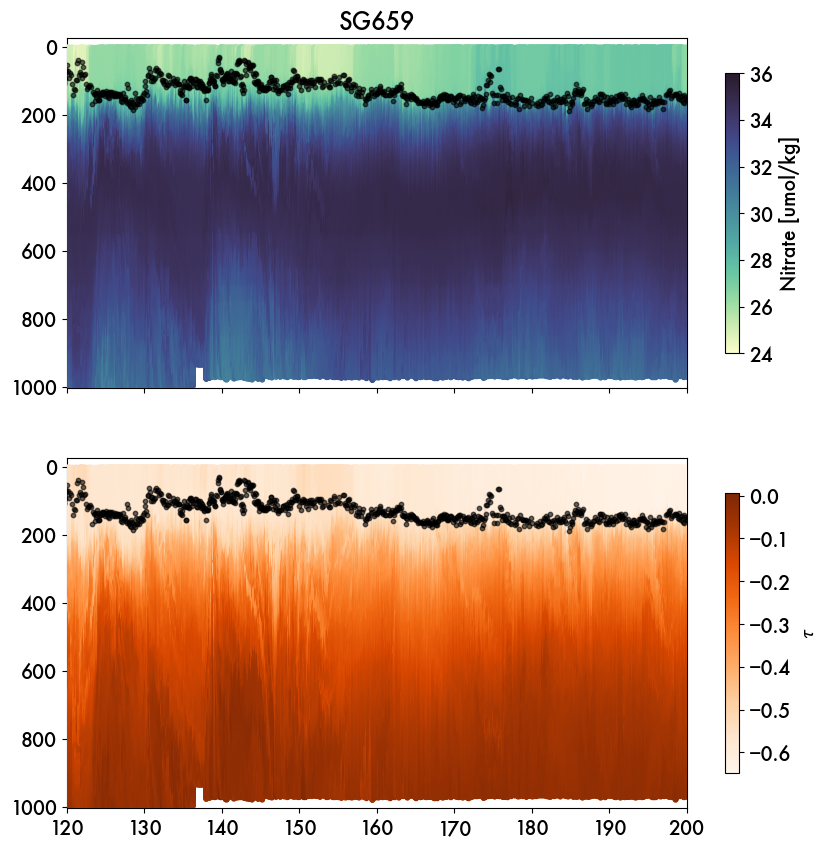

In [31]:
# Show spice and density in 2 subplots
glidtag = 'sg659'

# fig = plt.figure(figsize=(16,4)) # 16,4
# ax = fig.gca()

fig, axs = plt.subplots(2,1, figsize=(10,10), sharex=True)
axs = axs.flatten()

df_glid = df_659[df_659.pressure<1000]
sca = axs[0].scatter(df_glid.yearday, df_glid.pressure,c=df_glid.nitrate_G, cmap=cmo.deep, s=10, zorder=3, vmin=24, vmax=36)
sca2 = axs[1].scatter(df_glid.yearday, df_glid.pressure, c=df_glid.spice, cmap='Oranges', s=10, zorder=3)

# sns.set_palette("Reds")
# for sigma in ave_isopycnal_659[3:4]:
#     for ax in axs:
#         ax.scatter(isosignal_659[sigma].yearday, isosignal_659[sigma].pressure, c = 'r', s=12, label=sigma, alpha=0.8, zorder=3)

for ax in axs:
    ax.scatter(dav_659.yearday, dav_659.mld, s=10, c='k', alpha=0.6, zorder=3)
    ax.set_xlim([120, 200])
    ax.invert_yaxis()
    ax.set_ylim([1005,-25])

# plt.legend(fontsize=18, loc="lower right")
axs[0].set_title('SG659')

# plt.colorbar(sca, shrink=0.8).set_label('$\sigma_0$', fontsize=18)
plt.colorbar(sca, shrink=0.8).set_label('Nitrate [umol/kg]')
plt.colorbar(sca2, shrink=0.8).set_label(r'$\tau$')

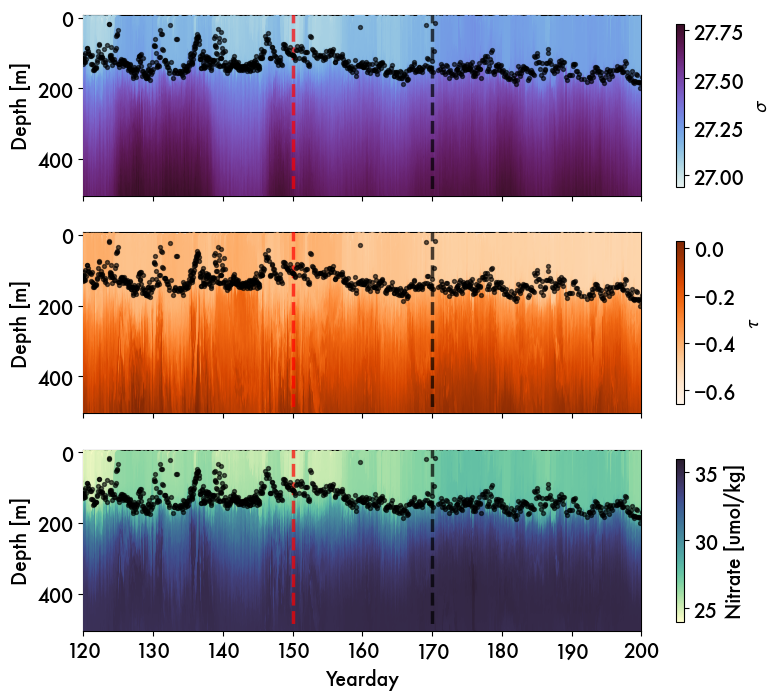

In [34]:
# MAIN PLOT 3 FIG moved to RF_mixedlayer_analysis
#  Show spice, density, and nitrate in 3 subplots
glidtag = 'sg660'

# fig = plt.figure(figsize=(16,4)) # 16,4
# ax = fig.gca()

fig, axs = plt.subplots(3,1, figsize=(9,8), sharex=True)
axs = axs.flatten()

depth = 500
df_glid = df_660[df_660.pressure<depth]
sca = axs[0].scatter(df_glid.yearday, df_glid.pressure,c=df_glid.sigma0, cmap=cmo.dense, s=8, zorder=3)
sca2 = axs[1].scatter(df_glid.yearday, df_glid.pressure, c=df_glid.spice, cmap='Oranges', s=8, zorder=3)
sca3 = axs[2].scatter(df_glid.yearday, df_glid.pressure, c=df_glid.nitrate_G, cmap=cmo.deep, s=8, zorder=3, vmin=24, vmax=36)


for ax in axs[:]:
    ax.vlines(150, -20,500, color='r', linewidth=2.5, linestyle='dashed', alpha=0.7, zorder=3)
    ax.vlines(170, -20,500, color='k', linewidth=2.5, linestyle='dashed', alpha=0.7, zorder=3)

for ax in axs:
    ax.scatter(dav_660.yearday, dav_660.mld, s=8, c='k', alpha=0.6, zorder=3)
    ax.set_xlim([120, 200])
    ax.invert_yaxis()
    ax.set_ylim([depth+5,-8])
    ax.set_ylabel('Depth [m]')

axs[2].set_xlabel('Yearday')
# plt.legend(fontsize=14, loc="lower right")
# plt.title('isopycnal depth, ' + glidtag)

plt.colorbar(sca, shrink=0.9).set_label('$\sigma$', fontsize=14)
plt.colorbar(sca2, shrink=0.9).set_label(r'$ \tau $', fontsize=14)
plt.colorbar(sca3, shrink=0.9).set_label('Nitrate [umol/kg]', fontsize=14)


In [35]:
# figure: single glider section

# glidtag = 'sg660'
# # sns.set_palette("Greys")
# fig = plt.figure(figsize=(16,4)) # 16,4
# ax = fig.gca()


# df_glid = df_660[df_660.pressure<420]
# sca = ax.scatter(df_glid.yearday, df_glid.pressure,c=df_glid.nitrate_G, cmap=cmo.deep, s=10, zorder=3)

# sns.set_palette("Reds")
# for sigma in ave_isopycnal_660[3:4]:
#     ax.scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].pressure, c = 'r', s=12, label=sigma, alpha=0.8, zorder=3)
# # sigma_colors[sigma]
# ax.scatter(dav_660.yearday, dav_660.mld, s=10, c='k', alpha=0.6, zorder=3)
# ax.set_xlim([120, 160])
# ax.grid(zorder=1)
# ax.invert_yaxis()
# ax.set_ylim([420,5])

# # plt.legend(fontsize=18, loc="lower right")
# # plt.title('isopycnal depth, ' + glidtag)
# plt.colorbar(sca).set_label('Nitrate (umol/kg)', fontsize=22)

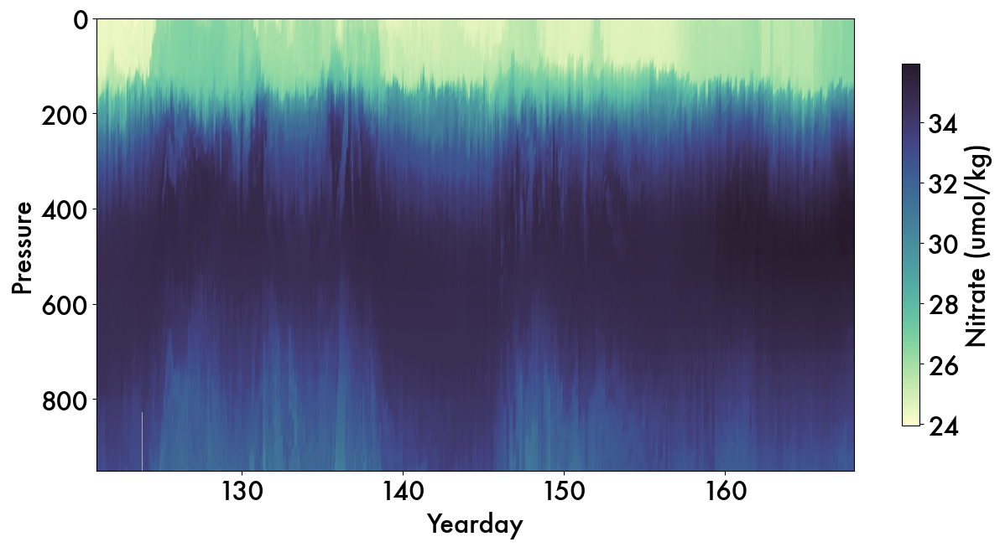

In [544]:
# Single large Glider prediction nitrate profile
minday = 121
maxday = 168
maxpres = 950

dat = df_660[(df_660.yearday <maxday) & (df_660.yearday > minday)]
dat = dat[dat.pressure < maxpres]
# tag = 'Model G, sg660df_660'


fig  = plt.figure(figsize=(13,7), tight_layout=True) #12,6
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.nitrate, cmap=cmo.deep, s=60) #, vmin=1.5, vmax=3.6) #, marker='s')
# ax.set_title(tag )

plt.colorbar(sca, ax=ax, shrink=0.8).set_label('Nitrate (umol/kg)')

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
ax.set_ylim([maxpres,0])

ax.set_facecolor('darkgrey')



(900.0, 0.0)

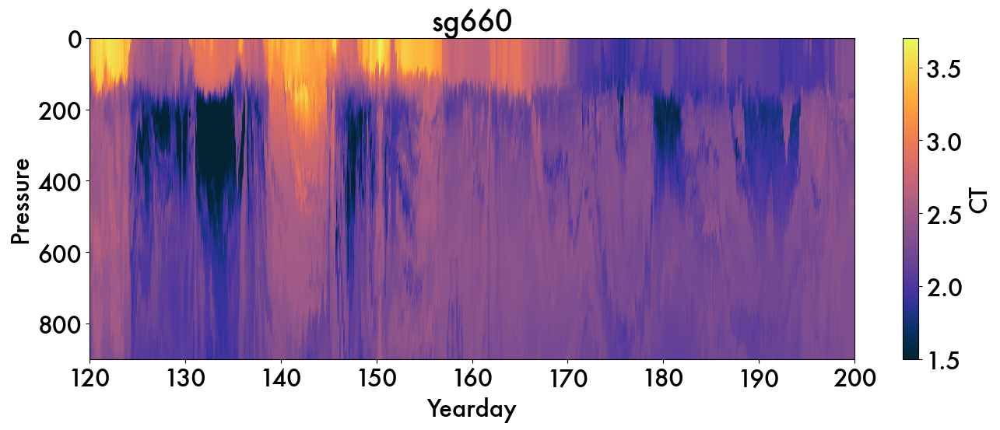

In [155]:
# * Glider CT profile
minday = 120
maxday = 200

dat = df_660[(df_660.yearday <maxday) & (df_660.yearday > minday)]

fig  = plt.figure(figsize=(14,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.CT, cmap=cmo.thermal, s=100, marker='s', vmin=1.5, vmax=3.7)
ax.set_title('sg660')

plt.colorbar(sca, ax=ax).set_label('CT')

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
ax.set_ylim([900,0])

# Float vs Glider Resolution

In [72]:
import mod_main as sg
reload(sg)
from mod_main import sgfloat, df_660
import mod_plot
reload(mod_plot)


mod_plot.compare_resolution(df_660, fsize=(8,6), minday=129, maxday=161, maxpres=750, dateformat=True)

/var/folders/nt/sjynqxjj7cz9r15fkd5d4r_40000gn/T/ipykernel_73004/4005107309.py:27: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_xticklabels(list)


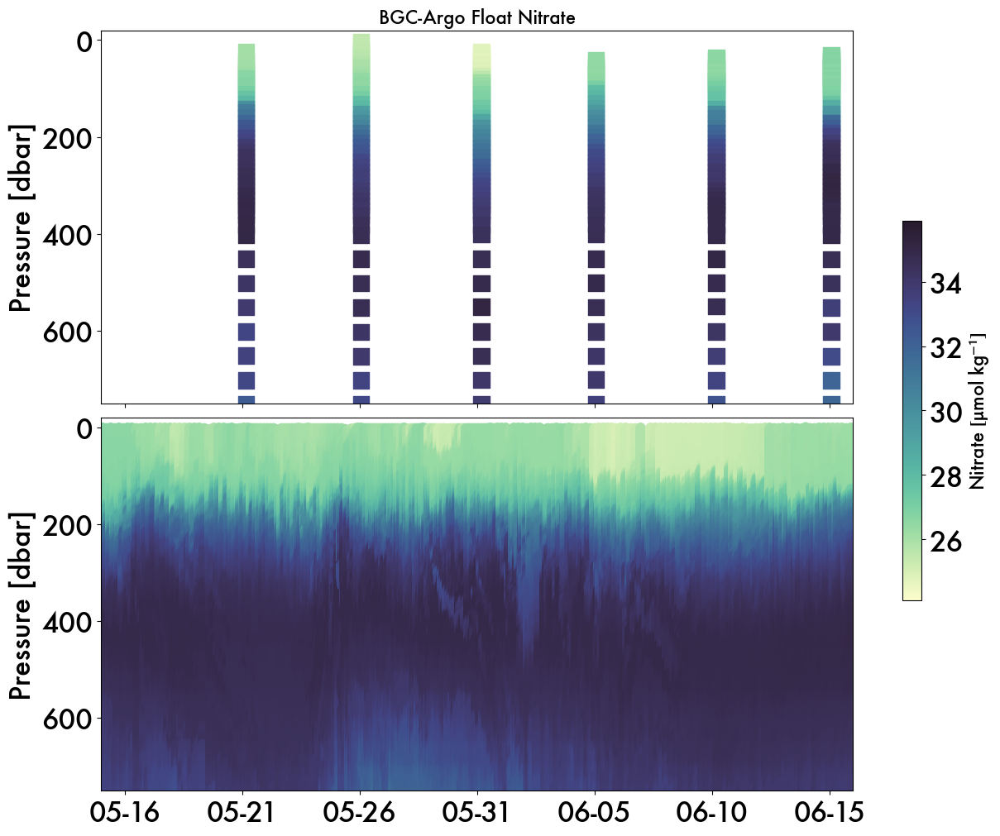

In [42]:
# ONE PLATFORM FOR GIF RESOLUTION
minday = 129
maxday = 161
maxpres = 750
fsize=(12,10)

fig, axs = plt.subplots(2,1, figsize=fsize, layout='constrained', sharex=True)

for ax in axs[0:1]:
    dat = sgfloat[(sgfloat.yearday <maxday) & (sgfloat.yearday > minday)]
    sca = ax.scatter(dat.yearday, dat.pressure, c=dat.nitrate, cmap=cmo.deep, s=200, marker='s' , vmin=24.1, vmax=35.9) #, marker='s')
    ax.set_title('BGC-Argo Float Nitrate', fontsize=16)

for ax in axs[1:]:
    dat = df_660[(df_660.yearday <maxday) & (df_660.yearday > minday)]
    dat = dat[dat.pressure < maxpres]
    sca = ax.scatter(dat.yearday, dat.pressure, c=dat.nitrate_G, cmap=cmo.deep, s=60, vmin=24.1, vmax=35.9) #, vmin=1.5, vmax=3.6) #, marker='s')

plt.colorbar(sca, ax=axs[:], shrink=0.5, orientation='vertical').set_label('Nitrate ' + umol_unit, fontsize=16)

######################
### Always ON
list = np.arange(130, 170, 5)
list = [sg.ytd2datetime(i) for i in list]
list = [np.datetime_as_string(i) for i in list]
list = [i[5:10] for i in list]
axs[1].set_xticklabels(list)

for ax in axs:
    ax.set_ylabel('Pressure [dbar]')
    ax.set_xlim([minday, maxday])
    ax.set_ylim([-20, maxpres])
    ax.invert_yaxis()

# ax.set_xlabel('Date in 2019')

# Additional Overlays

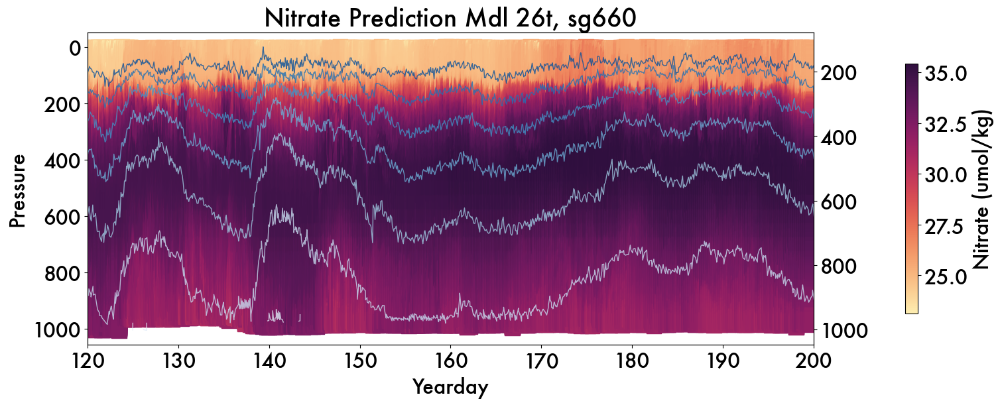

In [ ]:
# Plot density with density contours
# iso_dict = isoline_660.pop('27.2')
iso_dict = isoline_659
minday = 120
maxday = 200
df = df_660[(df_660.yearday <maxday) & (df_660.yearday > minday)]
tag = 'Mdl 26t, sg660'


# Create the scatter plot
fig, ax1 = plt.subplots(figsize=(15,6), layout='constrained')
sca = ax1.scatter(df['yearday'], df.pressure, c=df.nitrate_26t, cmap=cmo.matter, s=270, marker='s') #, vmin = 22.5, vmax=35.0)
ax1.set_ylabel('Pressure')

fig.colorbar(sca, ax=ax1, shrink=0.8).set_label('Nitrate (umol/kg)')

ax2 = ax1.twinx()
for ind, (key, val) in enumerate(iso_dict.items()):
    # Skipping lines for dates

    # Sort the DataFrame by 'yearday' to ensure the data points are in order
    val = val.sort_values(by = 'yearday')
    xval = []; yval = []

    # Iterate over the DataFrame and build the x and y values with NaN separators
    for i in range(len(val) - 1):
        xval.append(val.iloc[i]['yearday'])
        yval.append(val.iloc[i]['pressure'])
        if val.iloc[i + 1]['yearday'] - val.iloc[i]['yearday'] > 1:
            xval.append(None)
            yval.append(None)

    # Add the last data point
    xval.append(val.iloc[-1]['yearday'])
    yval.append(val.iloc[-1]['pressure'])

    ax2.plot(xval, yval, linewidth=1, label=key, color=palette[ind], alpha=0.8)

# ax2.legend(fontsize=14)
# labelLines(ax2.get_lines(), align=False, fontsize=18)
for ax in [ax1, ax2]:
    ax.invert_yaxis()
    ax.set_xlim([minday, maxday])

ax1.set_xlabel('Yearday')
plt.title('Nitrate Prediction ' + tag)

# ax1.axvline(x=187, color='c', linestyle='--', linewidth=1, alpha=0.9, zorder=3)
# ax1.axvline(x=194, color='c', linestyle='--', linewidth=1, alpha=0.9, zorder=3)
# Display the plot
plt.show()


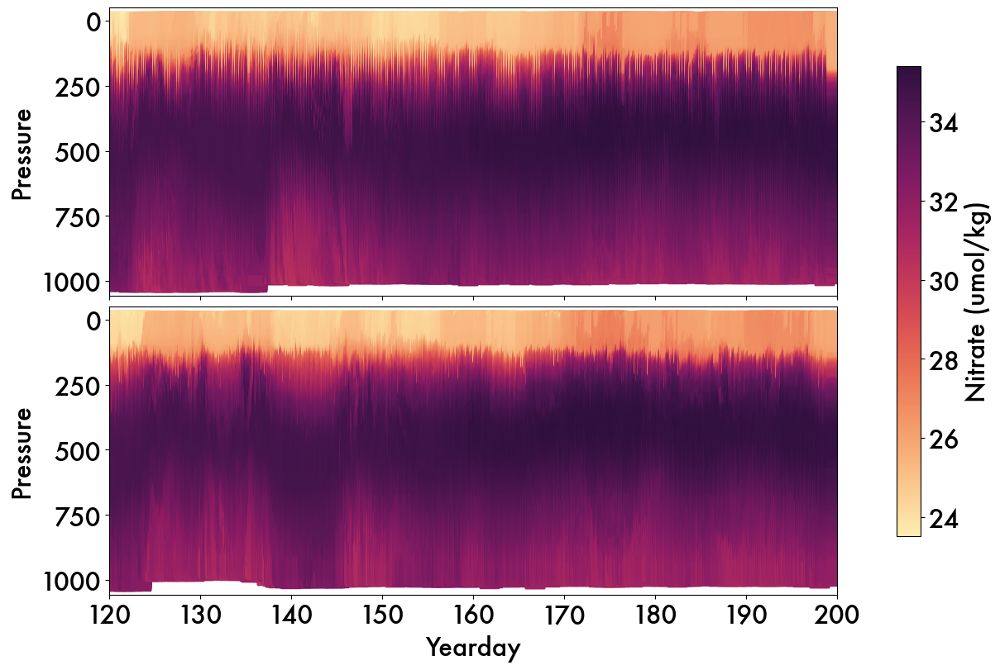

In [ ]:
# Plot density with density contours
iso_dict = isoline_660
minday = 120
maxday = 200
dat_660 = df_660[(df_660.yearday <maxday) & (df_660.yearday > minday)]
dat_659 = df_659[(df_659.yearday <maxday) & (df_659.yearday > minday)]
tag = 'Mdl 28t, sg660'


# Create the scatter plot
fig, axs = plt.subplots(2, 1, figsize=(12,8), sharex=True, layout='constrained')
axs = axs.flatten()

sca0 = axs[0].scatter(dat_659['yearday'], dat_659.pressure, c=dat_659.nitrate_28t, cmap=cmo.matter, s=270, marker='s') #, vmin = 22.5, vmax=35.0)
sca1 = axs[1].scatter(dat_660['yearday'], dat_660.pressure, c=dat_660.nitrate_28t, cmap=cmo.matter, s=270, marker='s') #, vmin = 22.5, vmax=35.0)

ax.set_ylabel('Pressure')
 
fig.colorbar(sca0, ax=axs[:], shrink=0.8).set_label('Nitrate (umol/kg)')

for ax in axs:
    ax.invert_yaxis()
    ax.set_xlim([minday, maxday])
    ax.set_ylabel('Pressure')

axs[1].set_xlabel('Yearday')
# plt.title('Nitrate Prediction ' + tag)

# Display the plot
plt.show()

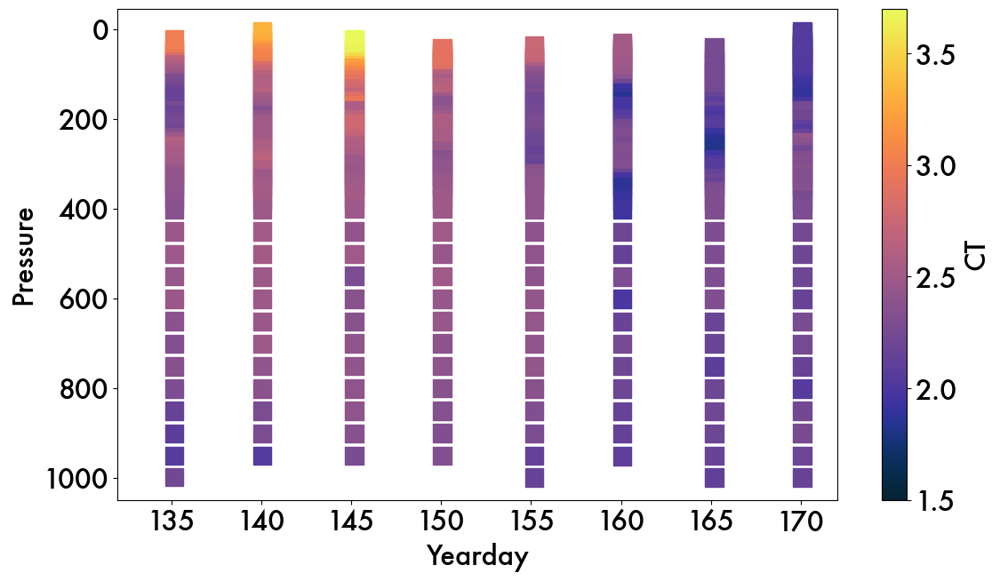

(800.0, 0.0)

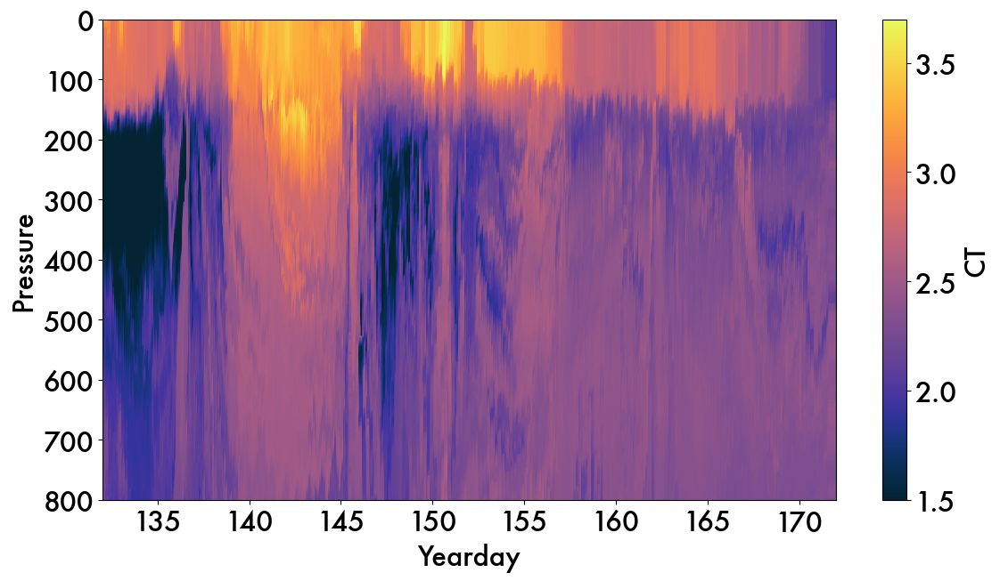

In [ ]:
# Float with glider
minday = 132
maxday = 172

# First plot float data
dat = test[(test.yearday <maxday) & (test.yearday > minday)]

fig  = plt.figure(figsize=(12,7), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.CT, cmap=cmo.thermal, s=220, marker='s', vmin=1.5, vmax=3.7) #, marker='s')
# ax.set_title('Float CT')

# ticklist = [1.5, 2.0, 2.5, 3.0, 3.5]
cbar = plt.colorbar(sca, ax=ax, ticks=ticklist).set_label('CT')
# cbar.set_yticklabels([1.5, 2.0, 2.5, 3.0, 3.5])

# plt.style.use("dark_background")

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
plt.show()

######################
# Plot Glider

dat = df_660[(df_660.yearday <maxday) & (df_660.yearday > minday)]
# tag = '26t, glider 659'

fig  = plt.figure(figsize=(12,7), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.CT, cmap=cmo.thermal, s=100, marker='s', vmin=1.5, vmax=3.7)
# ax.set_title('Model ' + tag )

plt.colorbar(sca, ax=ax).set_label('CT')

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
ax.set_ylim([800,0])





(800.0, 0.0)

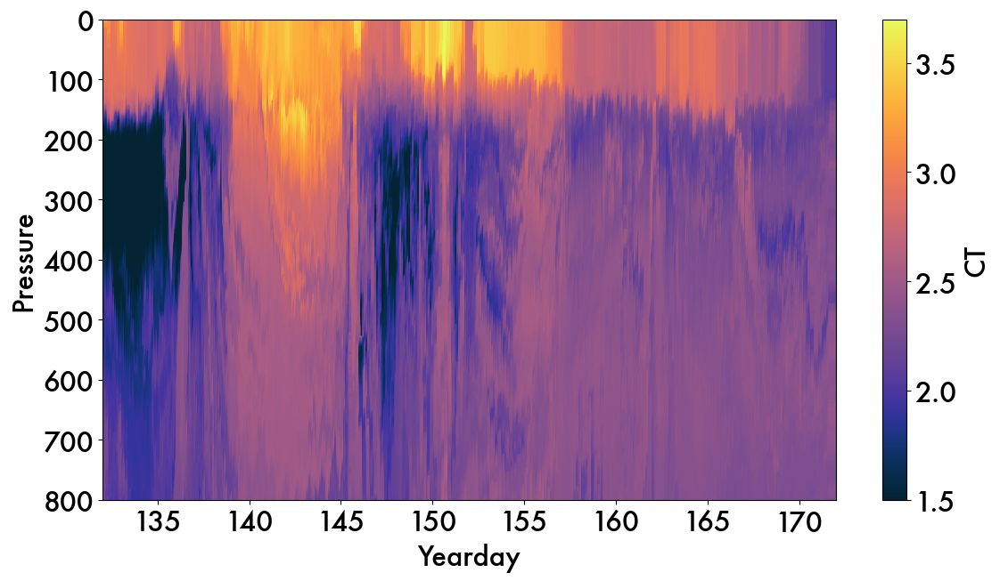

In [ ]:
# * Glider CT profile
minday = 132
maxday = 172

dat = df_660[(df_660.yearday <maxday) & (df_660.yearday > minday)]
# tag = '26t, glider 659'

fig  = plt.figure(figsize=(12,7), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.CT, cmap=cmo.thermal, s=100, marker='s', vmin=1.5, vmax=3.7)
# ax.set_title('Model ' + tag )

plt.colorbar(sca, ax=ax).set_label('CT')

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
ax.set_ylim([800,0])

(800.0, 0.0)

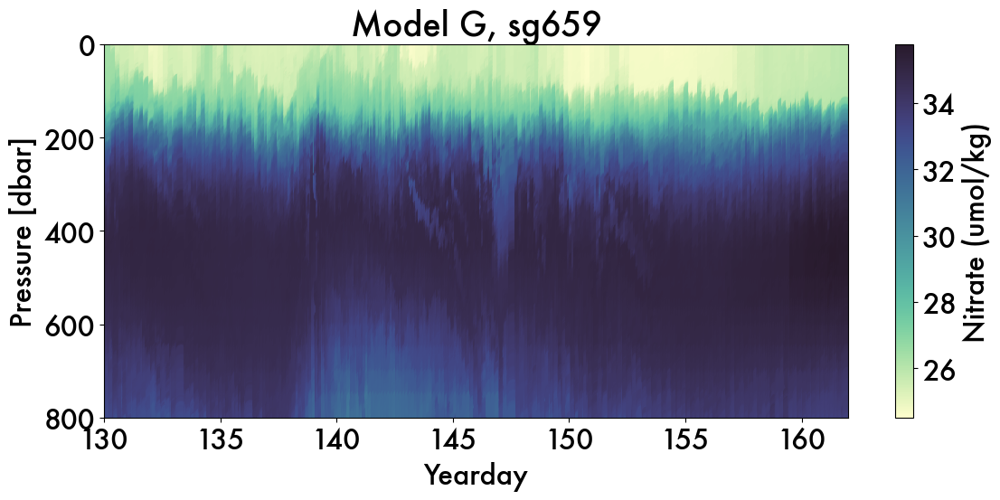

In [ ]:
# * Glider prediction nitrate profile
minday = 130
maxday = 162

dat = df_659[(df_659.yearday <maxday) & (df_659.yearday > minday)]
tag = 'Model G, sg659'


fig  = plt.figure(figsize=(12,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.nitrate_G, cmap=cmo.deep, s=50) #, vmin=1.5, vmax=3.6) #, marker='s')
ax.set_title(tag )

plt.colorbar(sca, ax=ax).set_label('Nitrate (umol/kg)')

ax.invert_yaxis()
ax.set_ylabel('Pressure [dbar]')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
ax.set_ylim([800,0])
